# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib
import pickle

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.station_embedding import learn_station_embeddings, attach_station_embedding
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [2, 3, 6, 12, 24, 48, 71]
ROLL_WINDOWS = [2, 3, 6, 12, 24, 48, 71]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

'''
# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
'''

# Store the results in one directory only, for testing API purpose
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_pmdata_test_models/"
if os.path.isdir(LIGHTGBM_DIR):
    import shutil
    shutil.rmtree(LIGHTGBM_DIR)
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_pmdata_test_models/


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

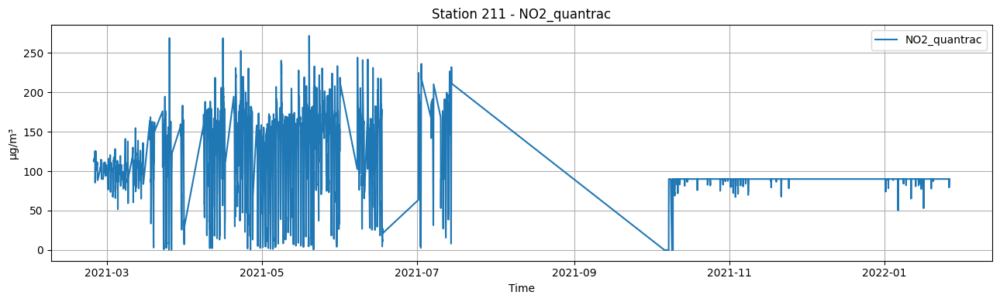

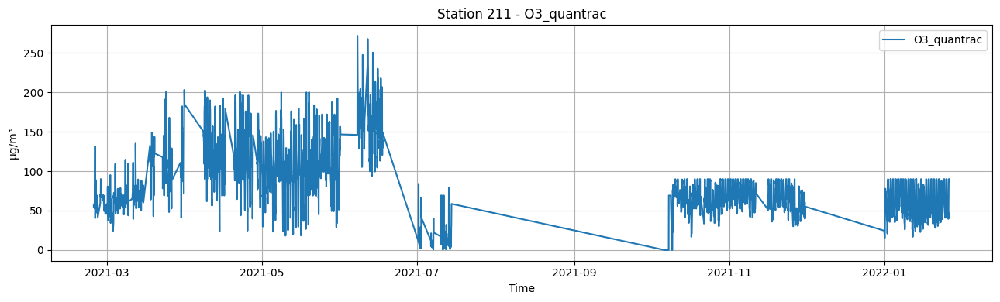

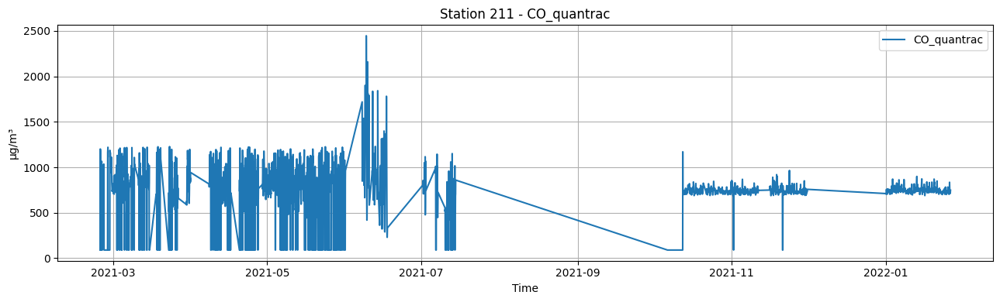

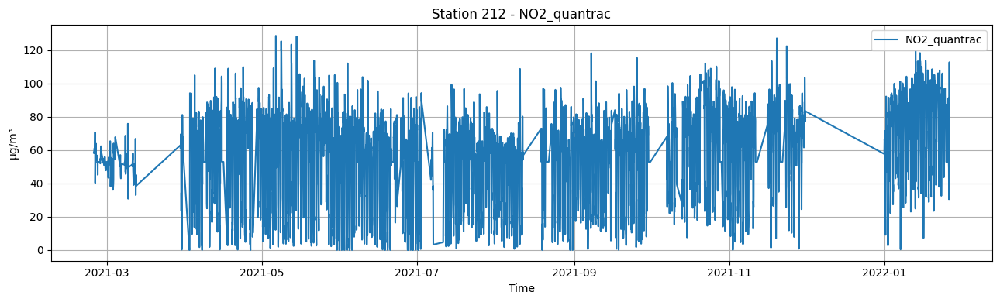

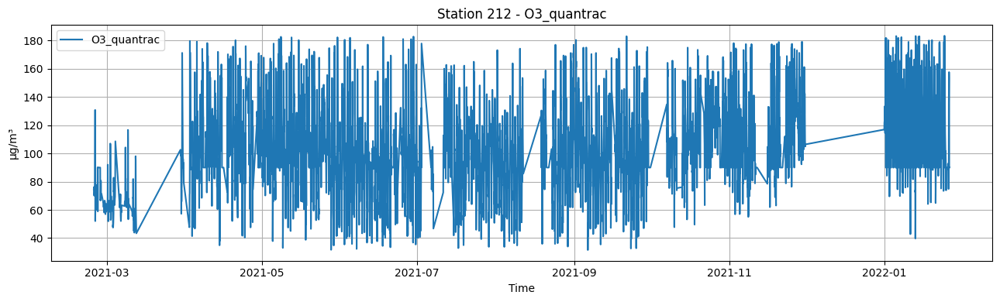

...

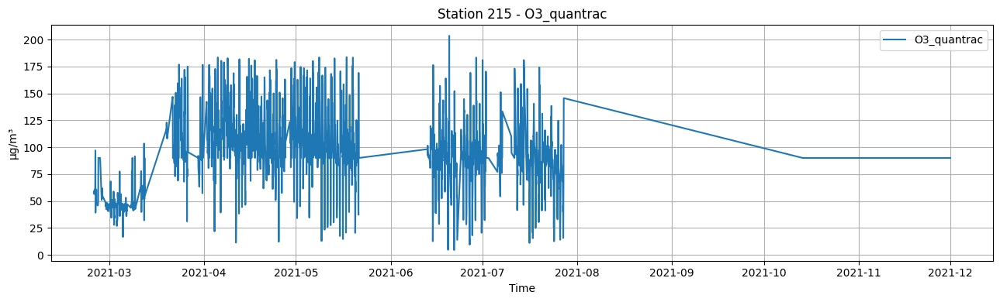

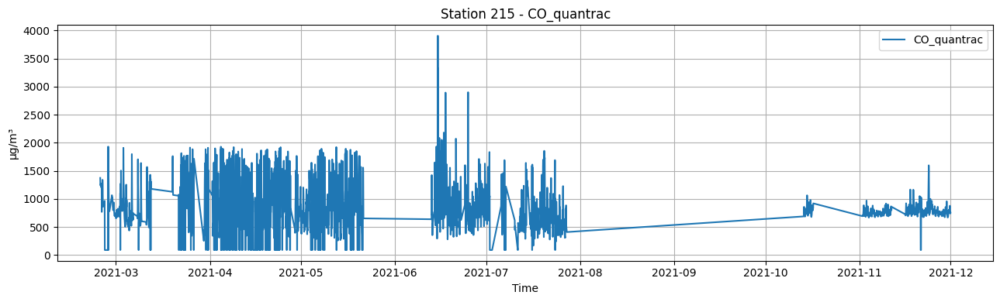

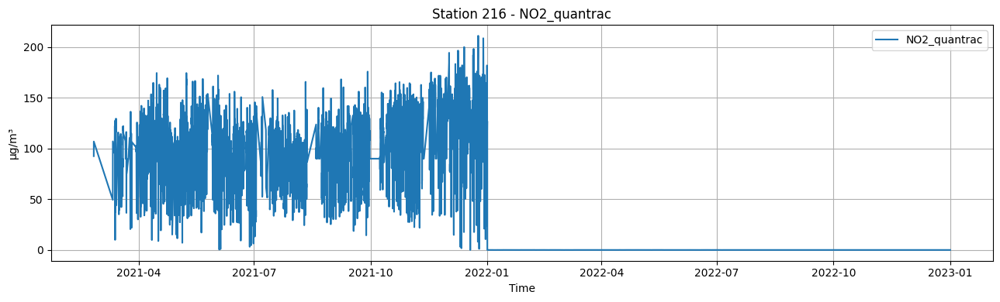

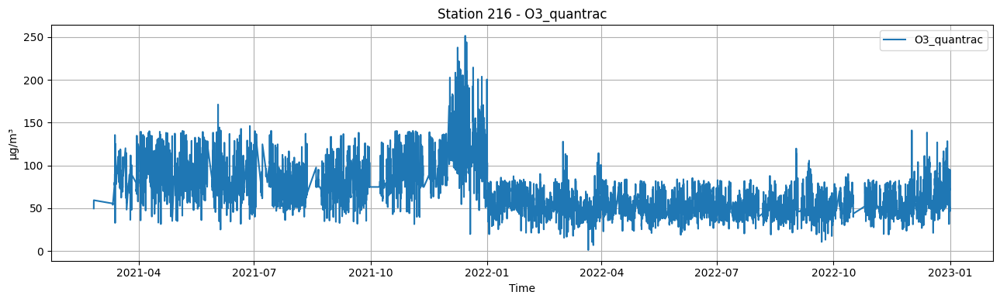

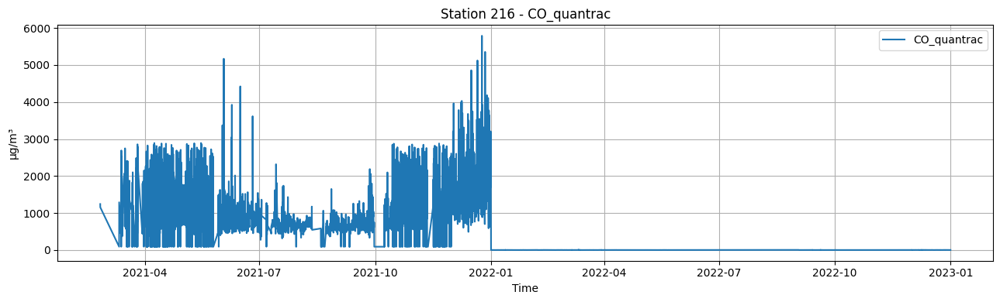

In [5]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

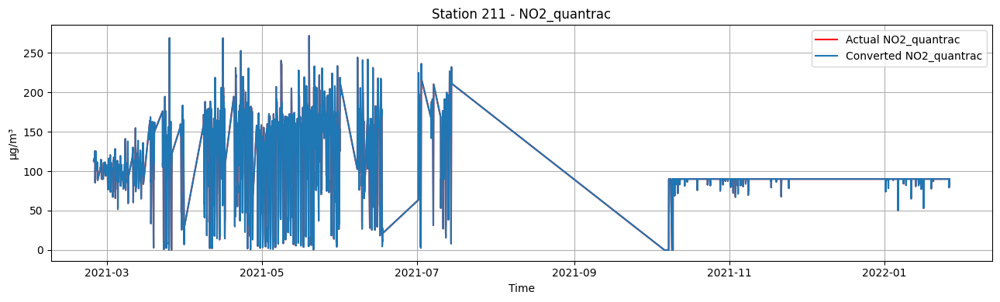

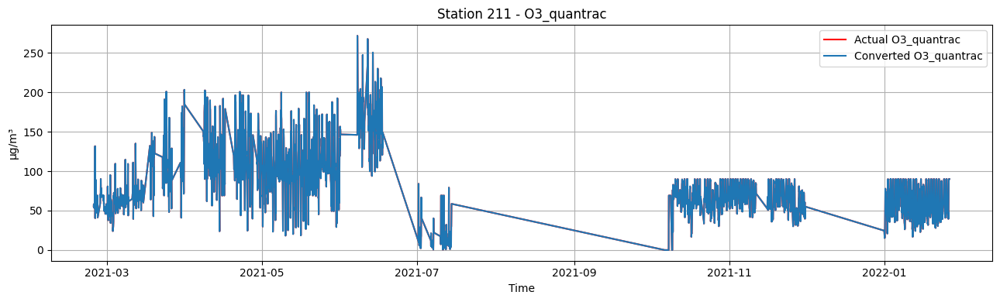

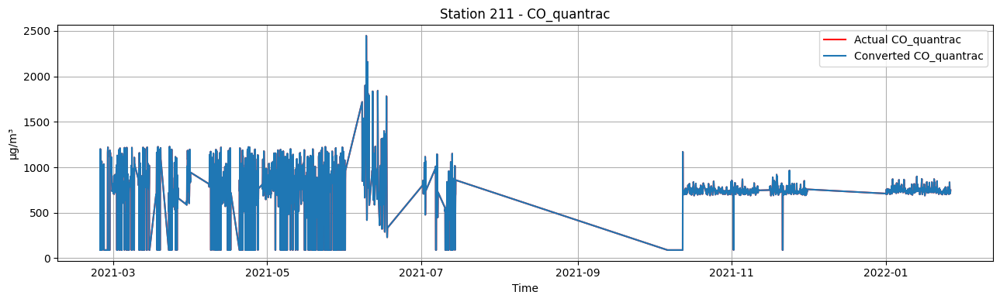

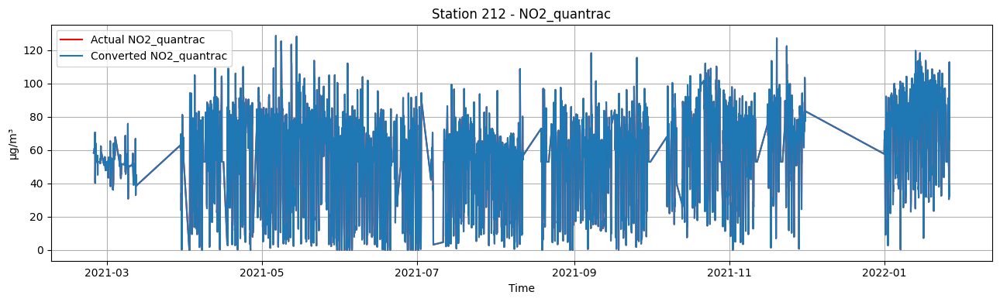

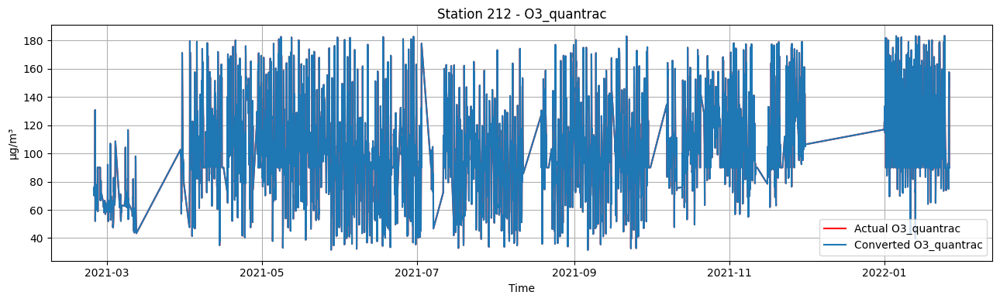

...

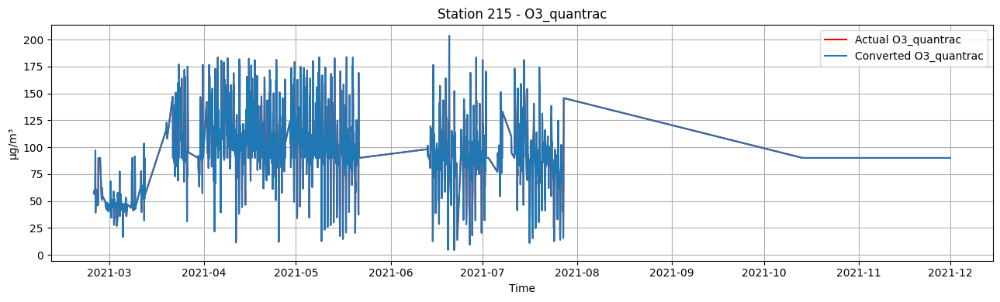

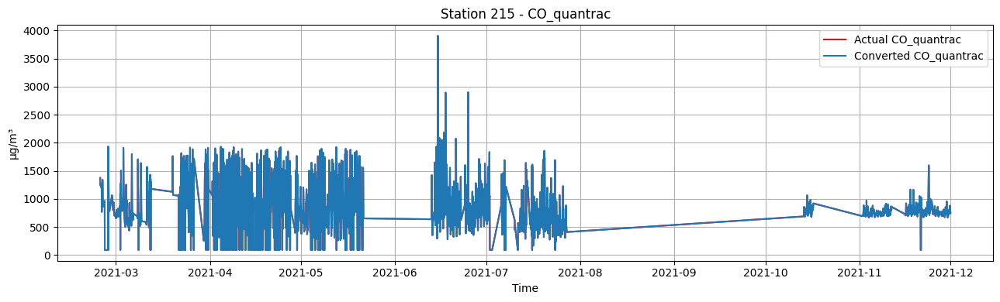

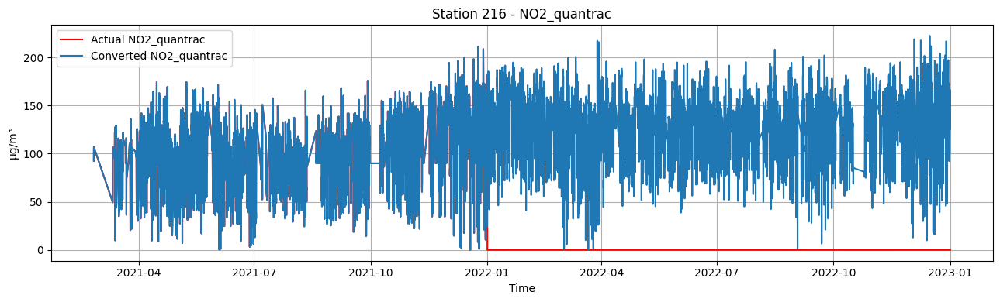

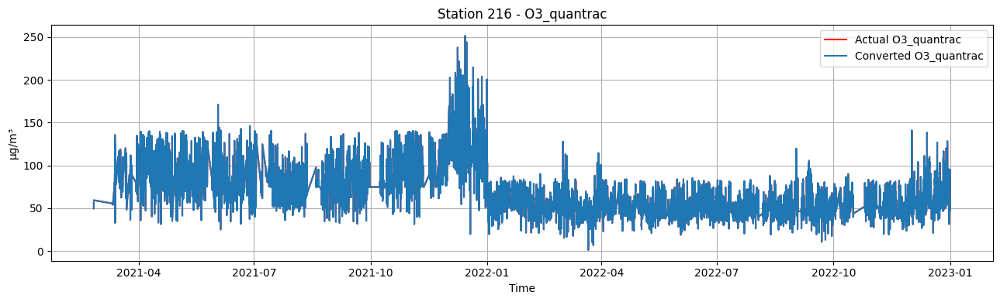

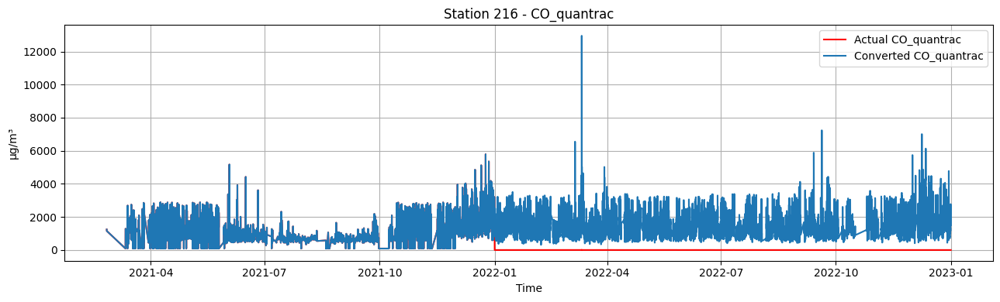

In [7]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

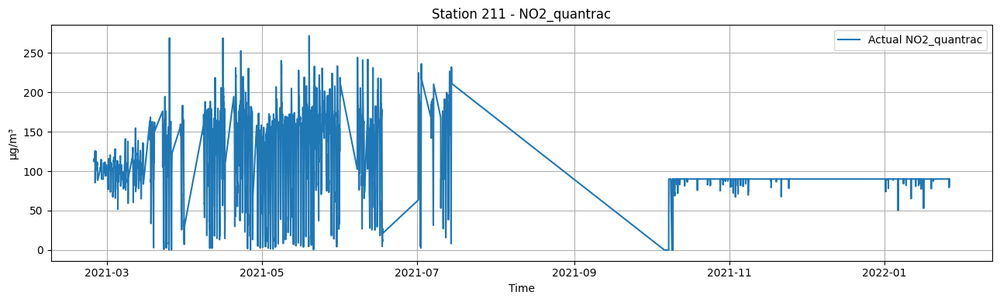

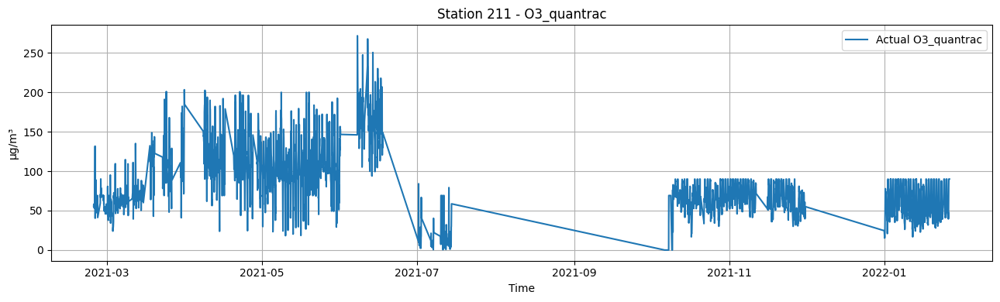

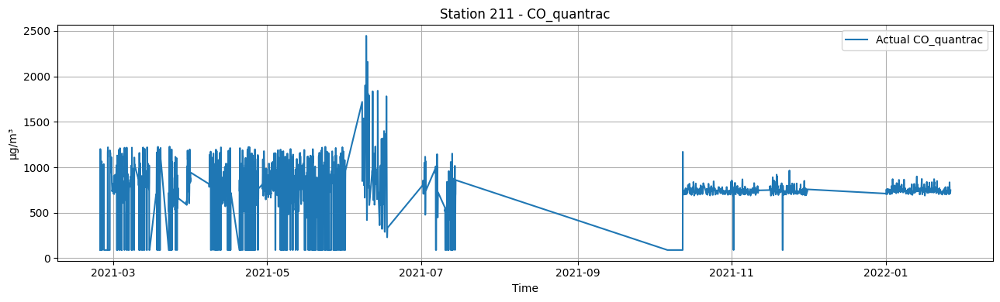

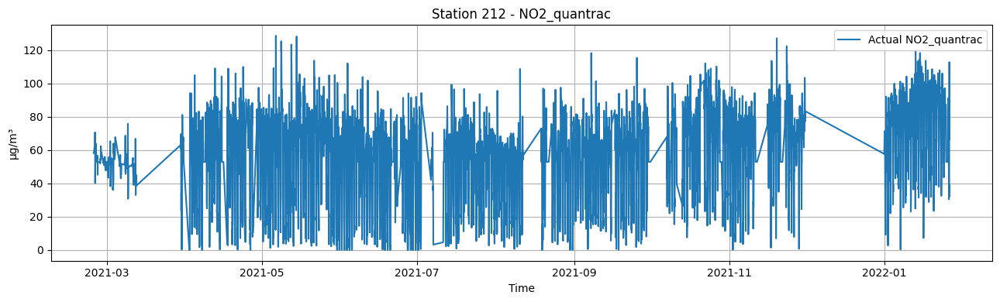

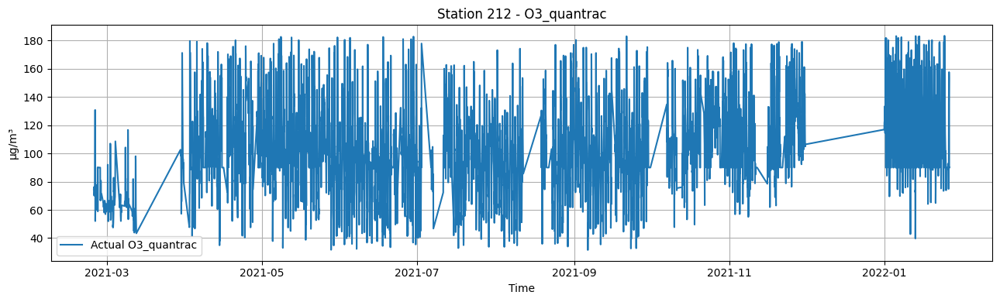

...

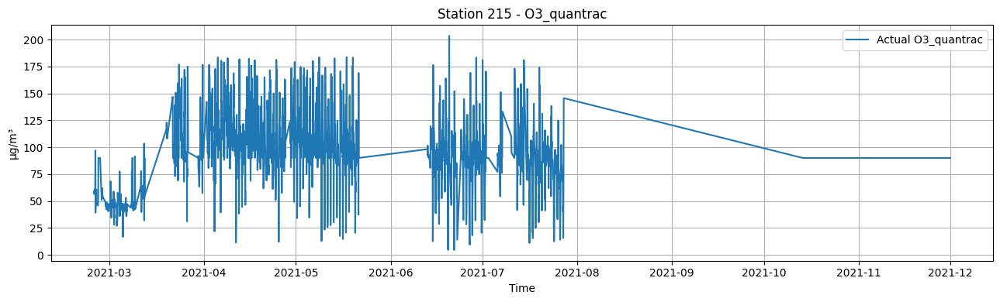

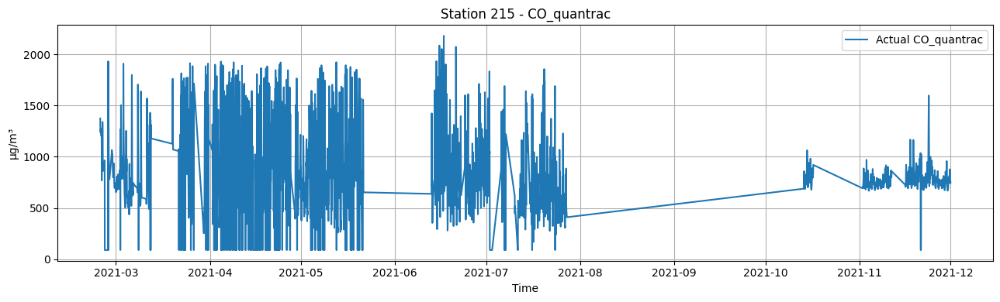

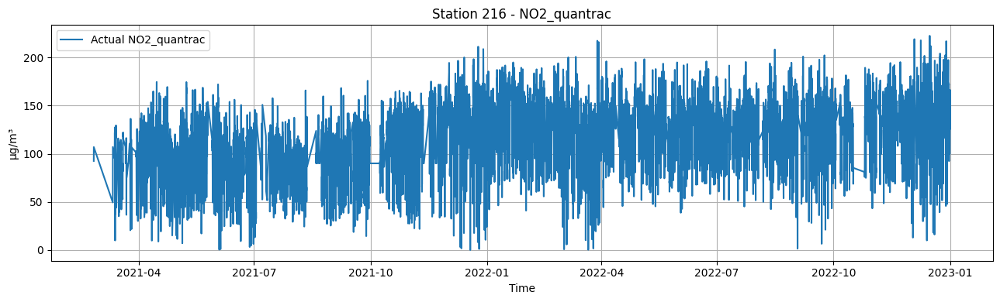

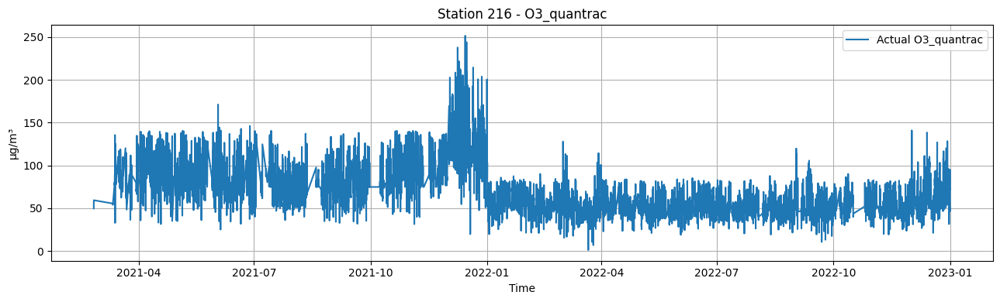

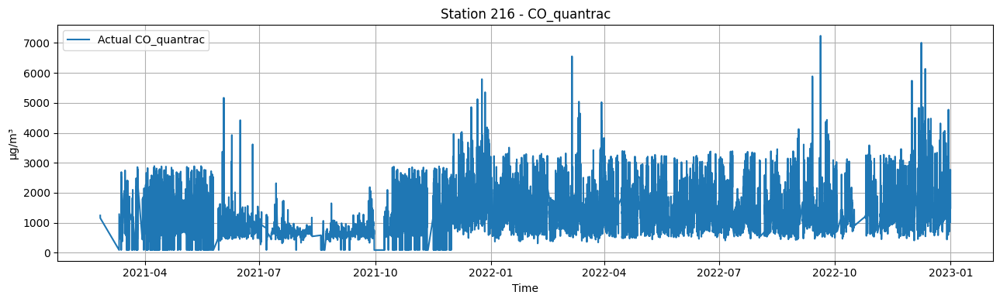

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

### Time features

In [10]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


### Station embedding

In [11]:
test_station_to_embedding, _ = learn_station_embeddings(dftestno2, target_col="NO2_quantrac", station_col="station_id", embed_dim=4)
print(test_station_to_embedding)

dftestno2, _ = attach_station_embedding(dftestno2, test_station_to_embedding, station_col="station_id")
display(dftestno2)

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


## Build supervised from time-series

In [12]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=1, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38542, 46) (38542, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,2022-12-31 18:00:00,216,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,2022-12-31 19:00:00,216,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,2022-12-31 20:00:00,216,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,2022-12-31 21:00:00,216,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,date,station_id,NO2_quantrac_t_plus_1h
0,2021-02-24 21:00:00,211,110.5361333000
1,2021-02-24 22:00:00,211,111.0693667000
2,2021-02-24 23:00:00,211,109.7206000000
3,2021-02-25 00:00:00,211,108.5600333000
4,2021-02-25 01:00:00,211,110.3479333000
...,...,...,...
38537,2022-12-31 18:00:00,216,166.1610133333
38538,2022-12-31 19:00:00,216,156.7136266667
38539,2022-12-31 20:00:00,216,158.7537600000
38540,2022-12-31 21:00:00,216,125.5152800000


## Split train/validation/test for each station

In [13]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)
display(y_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
3329,26.1833333300,35.8462000004,741.5384000000,24.0700000000,81.9216666700,4,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,89.4493298596,1.9075773226,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3330,14.0833333300,20.8097354148,725.9719000000,23.6400000000,80.2966666700,5,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3331,15.4000000000,21.1161272138,738.6734000000,23.5500000000,79.6700000000,6,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3332,20.7166666700,30.0598503566,757.8498000000,23.9883333300,80.2866666700,7,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3333,21.9166666700,51.8978718504,749.9997000000,26.6766666700,72.2516666700,8,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,112.6153600000,111.9562400000,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,126.0488533333,99.5898933333,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,153.2924800000,108.2526133333,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,162.2690666667,112.6153600000,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,NO2_quantrac_t_plus_1h
3329,90.0000000000
3330,90.0000000000
3331,90.0000000000
3332,90.0000000000
3333,90.0000000000
...,...
38537,166.1610133333
38538,156.7136266667
38539,158.7537600000
38540,125.5152800000


# LightGBM model

## Add time and lags features

In [14]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [15]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
no2_station_to_embedding, _ = learn_station_embeddings(df_no2, target_col=label, station_col="station_id", embed_dim=4)
df_no2, _ = attach_station_embedding(df_no2, no2_station_to_embedding, station_col="station_id")
print(no2_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as no2_emb_file:
    pickle.dump(no2_station_to_embedding, no2_emb_file)

# Print dataset
display(df_no2)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,NO2_quantrac_roll48_mean,NO2_quantrac_roll48_std,NO2_quantrac_roll71_mean,NO2_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,137.2270974346,24.3389891274,149.0162092153,26.2871324723,149.6282313162,33.5856868466,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,137.0636252124,24.1209076873,148.8579681042,26.1575760067,148.9147372317,32.6633175573,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,136.3835807679,23.2780210582,148.3289719931,25.7240543085,148.1313967622,31.7755792228,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,135.8343141013,22.5466882334,147.7620503264,25.1708505476,147.6048964806,31.2745676823,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657



===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (38260, 70)
y.shape = (38260, 3)

Number of features: 70

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag2
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag2
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag2
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag2
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag2
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag2
Humid_quantrac_l

,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,5.69,4.22,4.82,-0.52,0.36,581,-0.40
1,211,24,4.83,3.48,4.03,-0.37,0.22,578,-0.15
2,211,48,4.17,2.72,3.20,-1.07,0.21,574,-0.90
3,211,72,3.94,2.45,2.91,0.06,0.11,570,0.23
4,212,1,12.38,9.29,33.14,-18.07,0.85,867,3.18
5,212,24,16.56,13.42,45.75,-21.20,0.76,864,8.25
6,212,48,19.02,15.91,48.15,-18.74,0.70,860,11.00
7,212,72,22.17,18.71,49.62,-11.95,0.65,857,16.93
8,213,1,18.30,14.11,170.49,-151.28,0.83,880,-2.79
9,213,24,22.98,18.31,319.02,-297.72,0.72,877,-5.45


station_id = 211
hour = 1
X_test_sid.shape: (581, 68)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


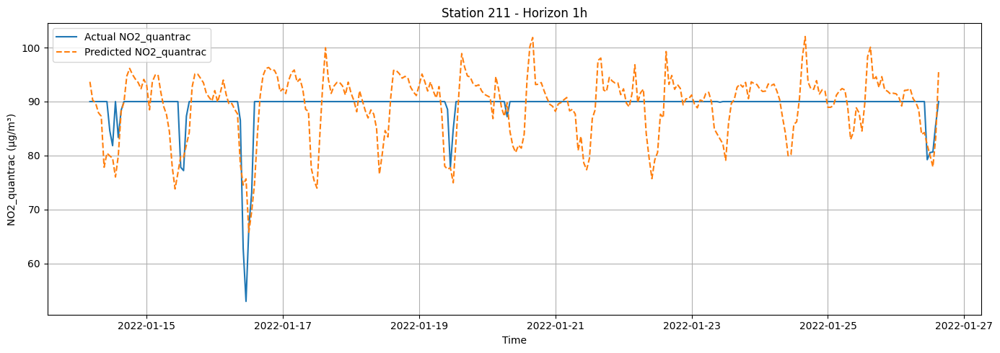

hour = 24
X_test_sid.shape: (578, 68)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


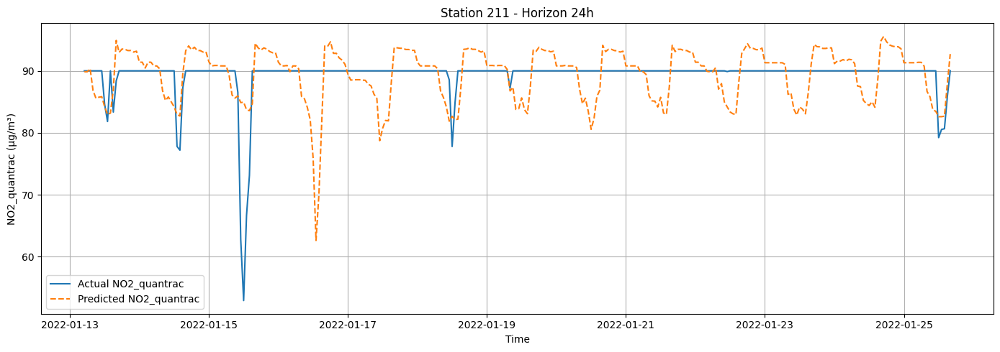

hour = 48
X_test_sid.shape: (574, 68)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


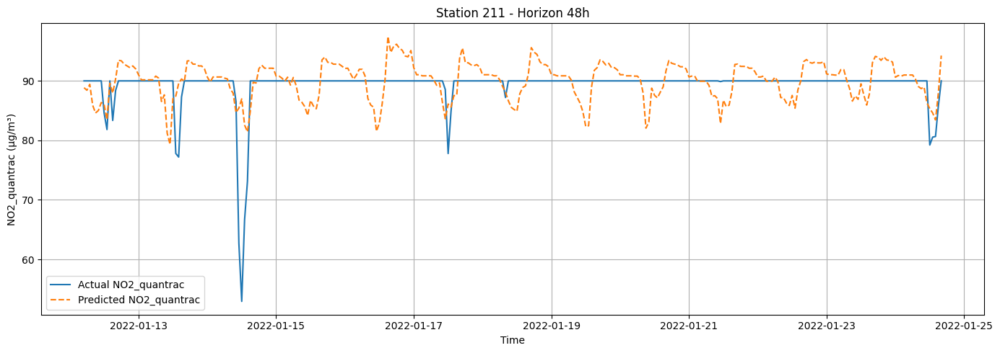

hour = 72
X_test_sid.shape: (570, 68)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


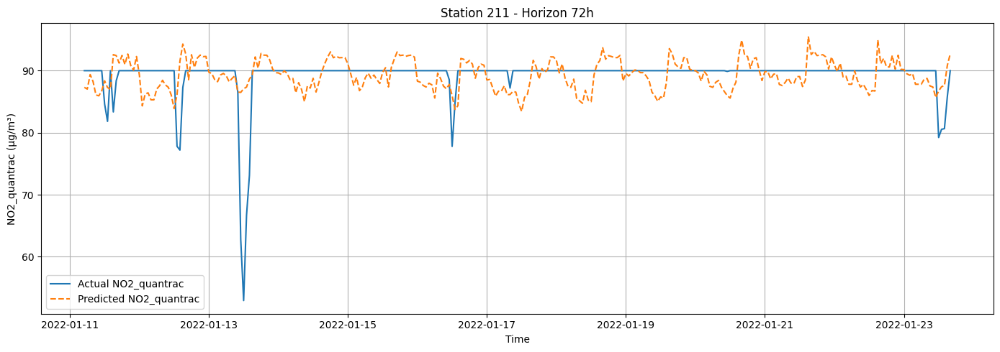

station_id = 212
hour = 1
X_test_sid.shape: (867, 68)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


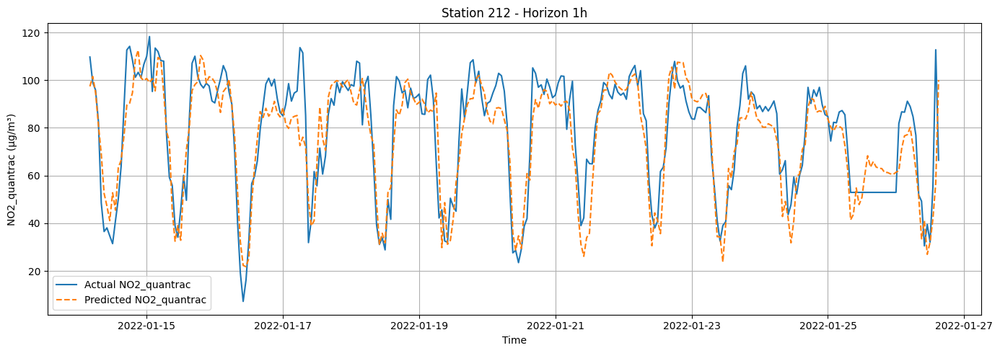

hour = 24
X_test_sid.shape: (864, 68)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


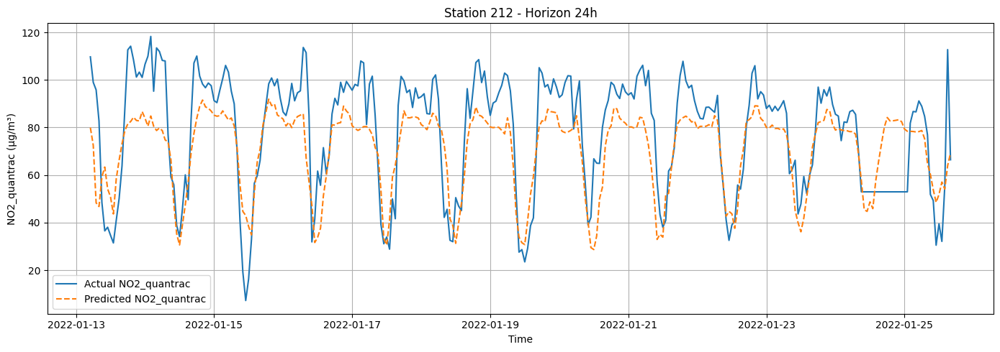

hour = 48
X_test_sid.shape: (860, 68)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


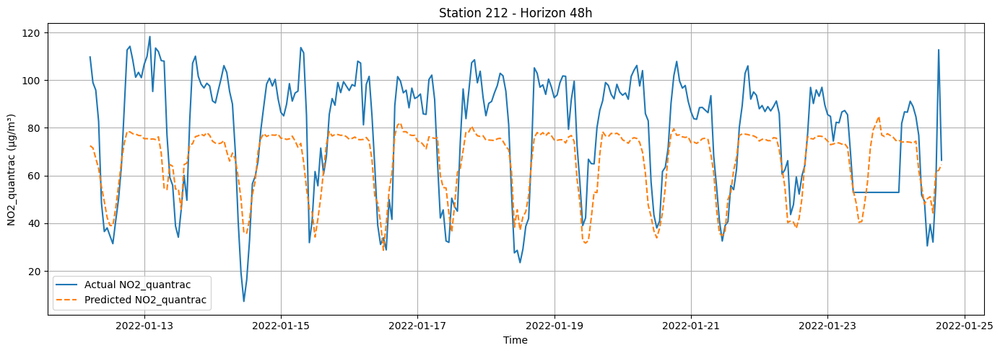

hour = 72
X_test_sid.shape: (857, 68)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


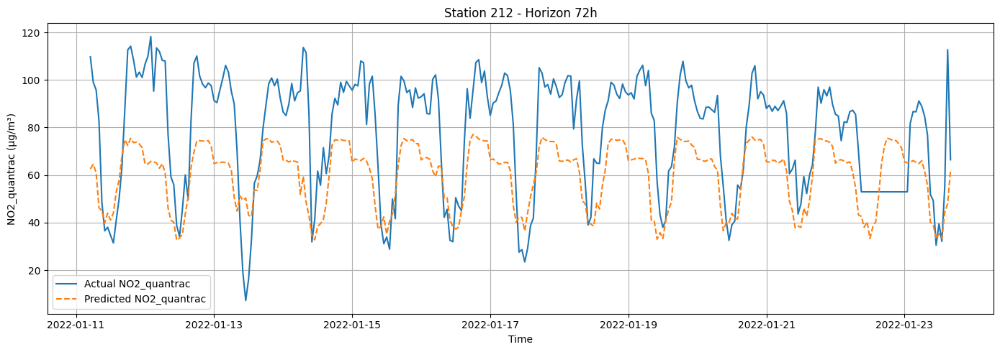

station_id = 213
hour = 1
X_test_sid.shape: (880, 68)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


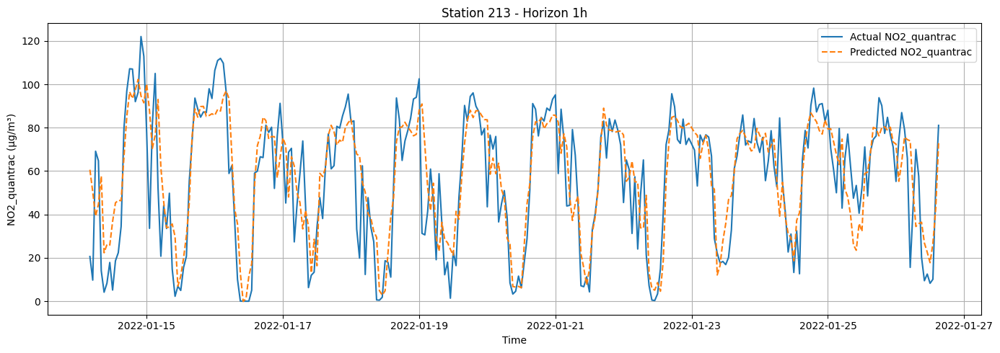

hour = 24
X_test_sid.shape: (877, 68)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


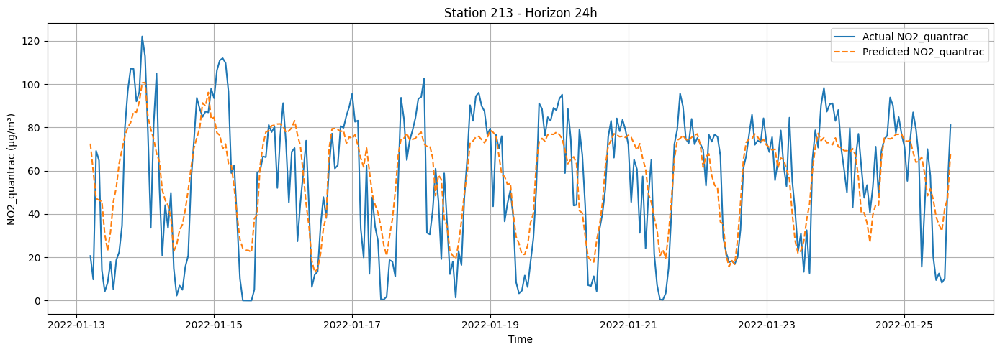

hour = 48
X_test_sid.shape: (873, 68)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


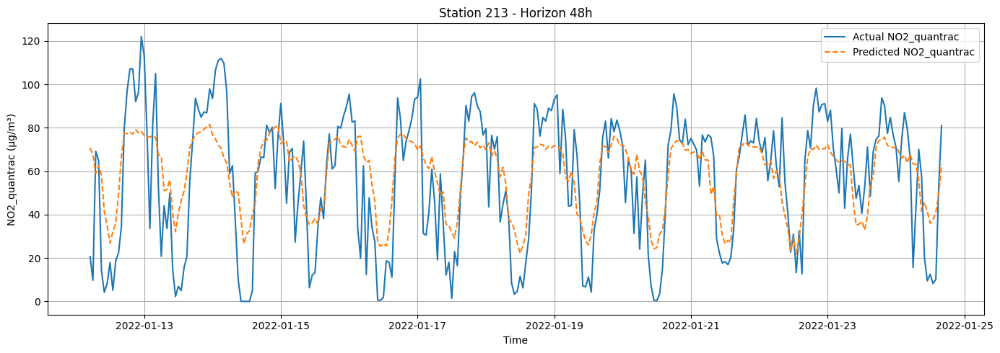

hour = 72
X_test_sid.shape: (869, 68)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


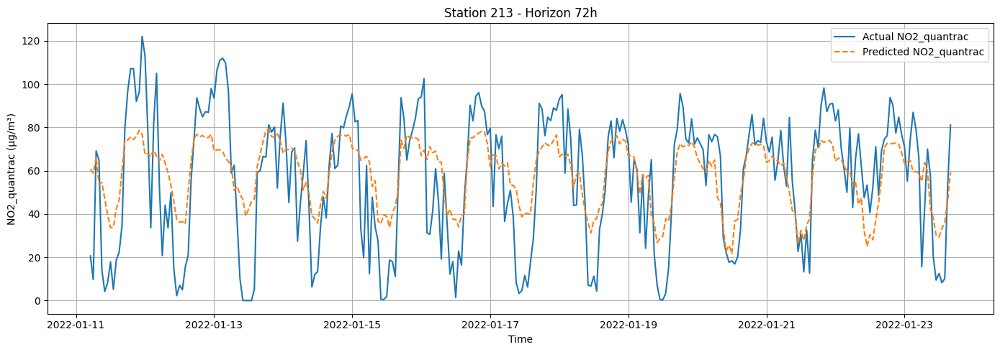

station_id = 214
hour = 1
X_test_sid.shape: (906, 68)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


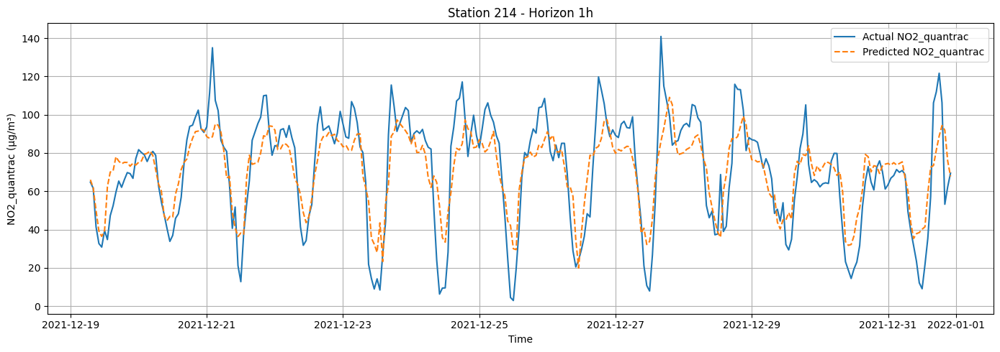

hour = 24
X_test_sid.shape: (902, 68)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


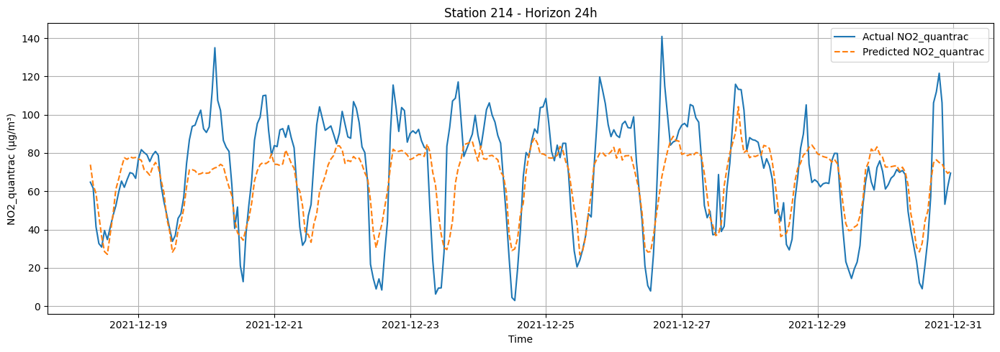

hour = 48
X_test_sid.shape: (899, 68)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


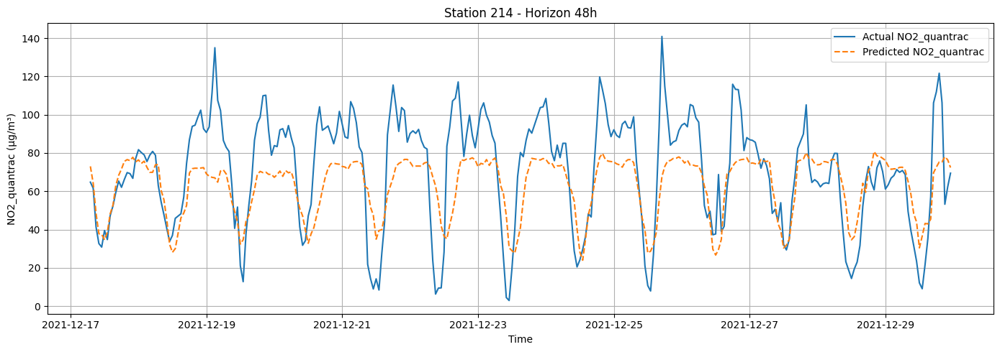

hour = 72
X_test_sid.shape: (895, 68)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


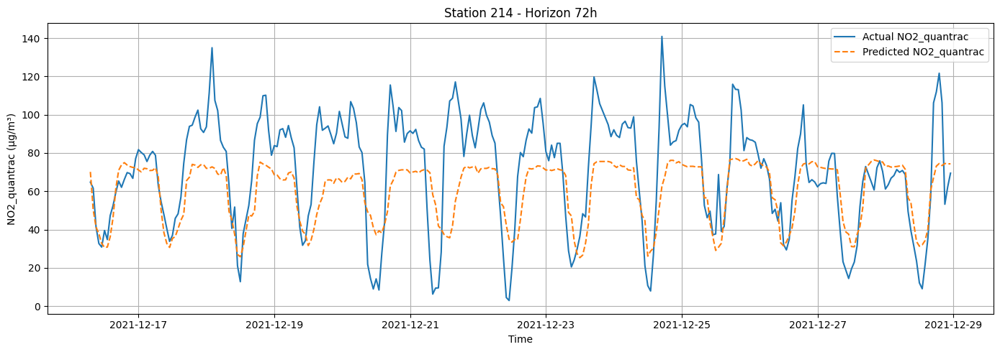

station_id = 215
hour = 1
X_test_sid.shape: (461, 68)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


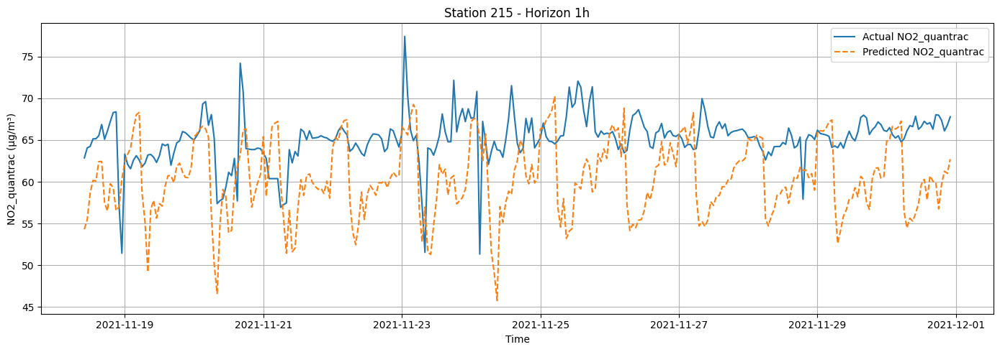

hour = 24
X_test_sid.shape: (458, 68)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


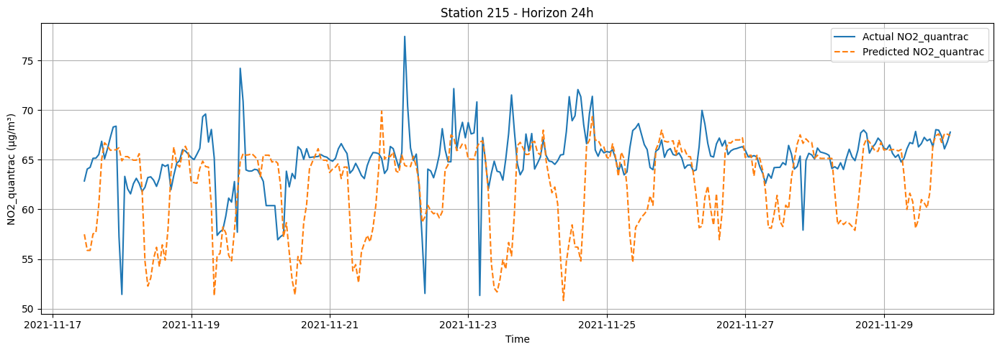

hour = 48
X_test_sid.shape: (454, 68)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


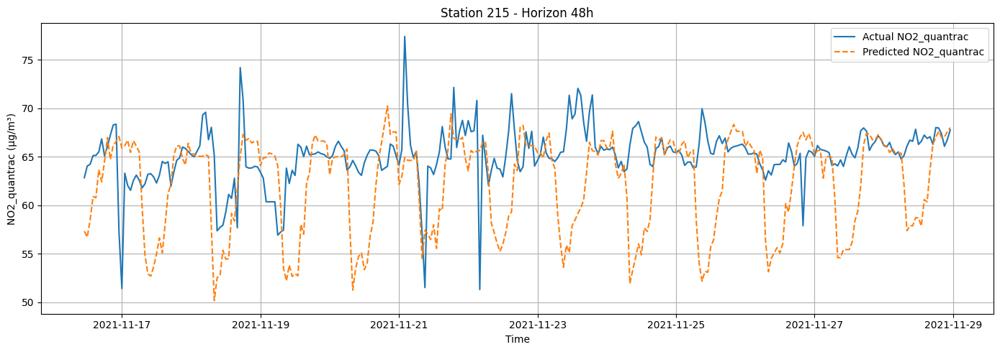

hour = 72
X_test_sid.shape: (450, 68)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


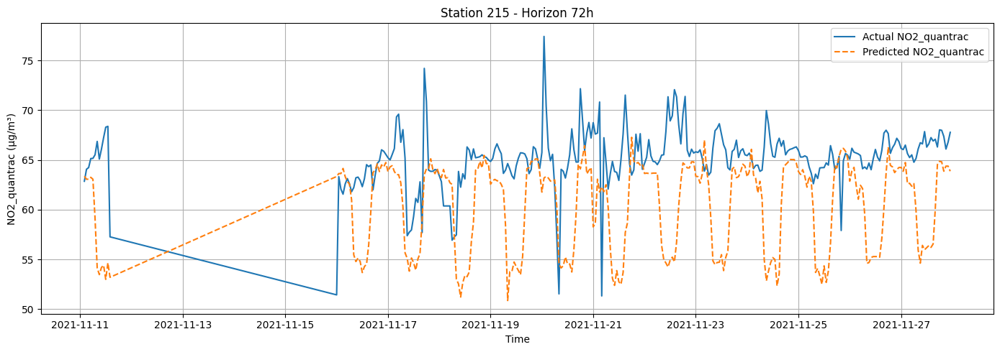

station_id = 216
hour = 1
X_test_sid.shape: (2046, 68)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


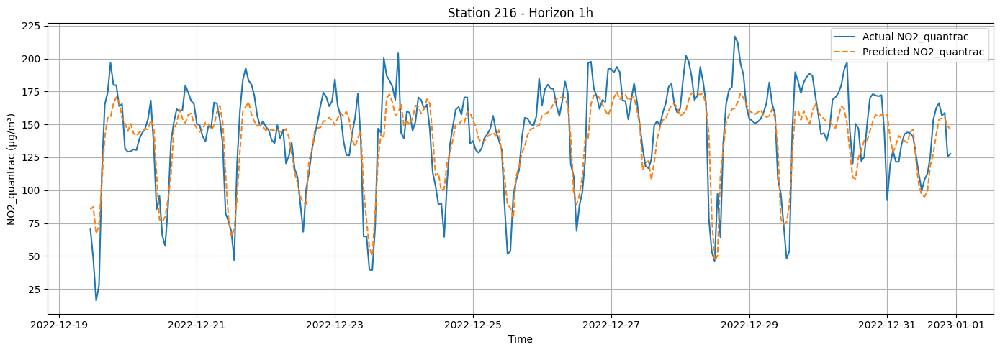

hour = 24
X_test_sid.shape: (2043, 68)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


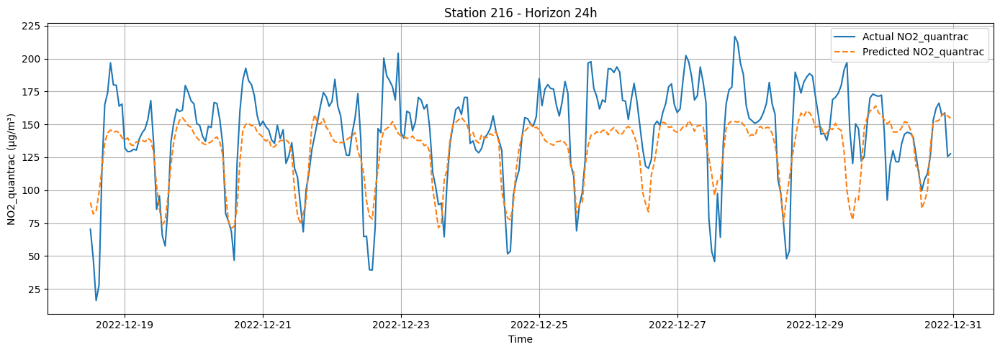

hour = 48
X_test_sid.shape: (2039, 68)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


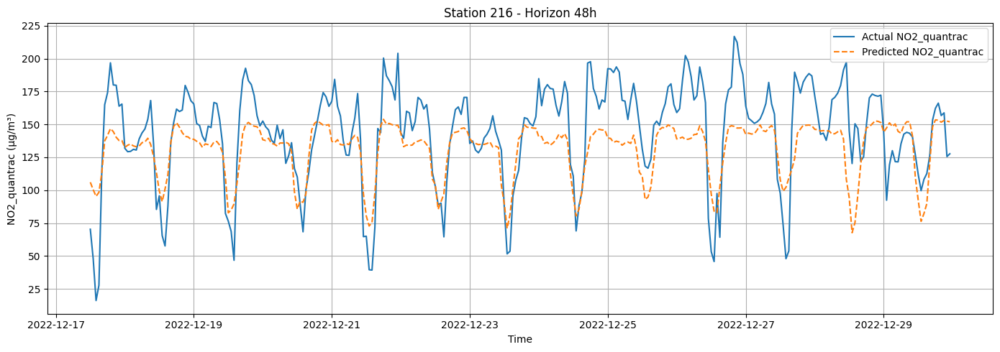

hour = 72
X_test_sid.shape: (2036, 68)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


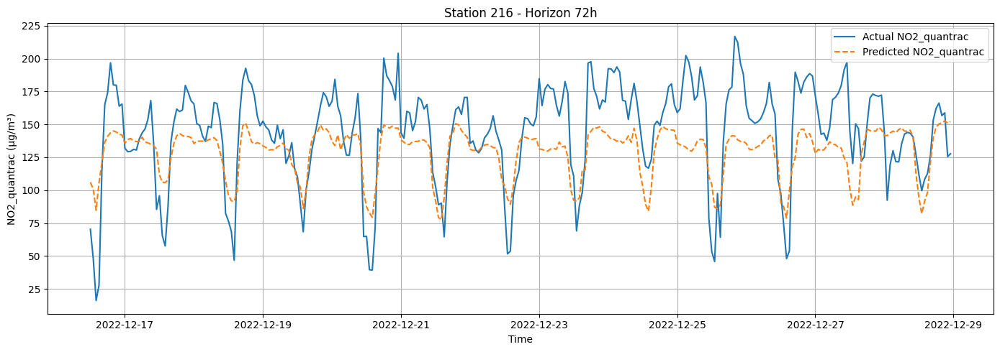

In [16]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [17]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
o3_station_to_embedding, _ = learn_station_embeddings(df_o3, target_col=label, station_col="station_id", embed_dim=4)
df_o3, _ = attach_station_embedding(df_o3, o3_station_to_embedding, station_col="station_id")
print(o3_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as o3_emb_file:
    pickle.dump(o3_station_to_embedding, o3_emb_file)

# Print dataset
display(df_o3)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all

[Embed] epoch 001 | train MSE=7205.8838 | val MSE=7192.1496
[Embed] epoch 010 | train MSE=4982.4207 | val MSE=4729.6205
[Embed] epoch 020 | train MSE=1154.7580 | val MSE=1087.1925
[Embed] epoch 030 | train MSE=849.5183 | val MSE=845.7694
[Embed] epoch 040 | train MSE=842.5061 | val MSE=841.4683
[Embed] epoch 050 | train MSE=842.2304 | val MSE=841.3656
{211: [6.3102427, -2.830071, -3.242811, -5.710138], 212: [5.6497054, -6.1378117, -4.827483, -6.0162816], 213: [4.3873553, -4.6534095, -4.2588835, -2.8678885], 214: [3.096077, -4.051208, -6.2767863, -3.596666], 215: [5.033126, -5.672511, -4.3594937, -5.4653296], 216: [3.4363449, -4.0281177, -4.587953, -2.7763786]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,O3_quantrac_roll24_mean,O3_quantrac_roll24_std,O3_quantrac_roll48_mean,O3_quantrac_roll48_std,O3_quantrac_roll71_mean,O3_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,55.4313809500,NaN,55.4313809500,NaN,55.4313809500,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,56.8142787100,1.9557127676,56.8142787100,1.9557127676,56.8142787100,1.9557127676,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,56.2193302500,1.7246150947,56.2193302500,1.7246150947,56.2193302500,1.7246150947,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,55.8564226875,1.5841945626,55.8564226875,1.5841945626,55.8564226875,1.5841945626,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,64.9380388157,15.0927718072,70.0763352689,14.5078761517,75.0341348152,17.3719114305,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,64.6470665934,14.7958230928,69.8784186022,14.3581777465,74.4562005429,16.6239740870,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.2442888157,14.6098932113,69.6353630467,14.3202126589,73.6949329372,15.7134658399,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,63.5192888157,14.6124020919,69.2311963800,14.4521933678,72.9925855194,15.4056634487,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316



===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (38260, 70)
y.shape = (38260, 3)

Number of features: 70

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag2
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag2
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag2
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag2
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag2
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag2
Humid_quantrac_l

,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,12.03,9.84,18.85,-7.94,0.82,581,-2.16
6,211,24,13.59,11.74,23.36,-10.64,0.80,578,-2.78
12,211,48,13.72,11.68,24.04,-13.00,0.80,574,-4.88
18,211,72,14.52,12.63,25.86,-13.47,0.81,570,-4.12
1,212,1,26.44,19.61,17.34,-2.92,0.37,867,1.05
7,212,24,28.52,22.85,19.34,2.27,0.24,864,6.19
13,212,48,28.87,23.24,19.88,1.18,0.18,860,5.20
19,212,72,31.31,25.13,20.48,7.65,0.19,857,11.48
2,213,1,26.37,20.89,60.59,-41.90,0.65,880,-1.49
8,213,24,30.12,24.46,76.10,-56.68,0.50,877,-4.73


station_id = 211
hour = 1
X_test_sid.shape: (581, 68)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


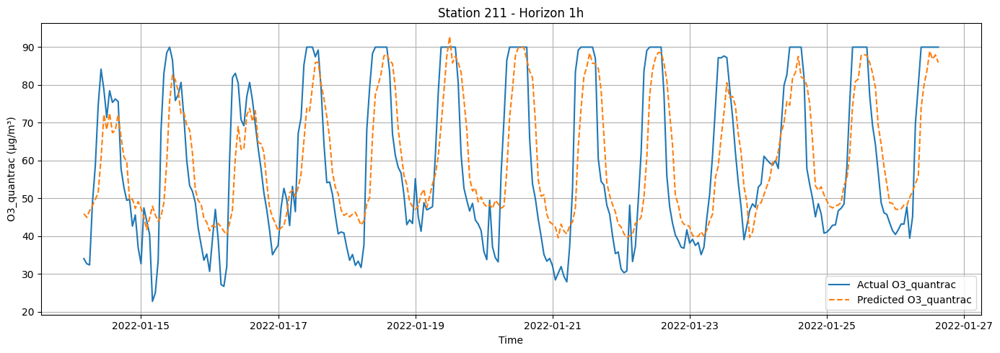

hour = 24
X_test_sid.shape: (578, 68)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


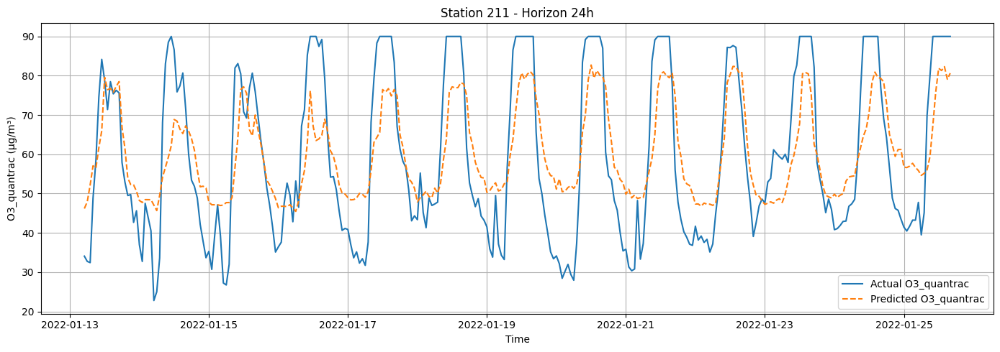

hour = 48
X_test_sid.shape: (574, 68)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


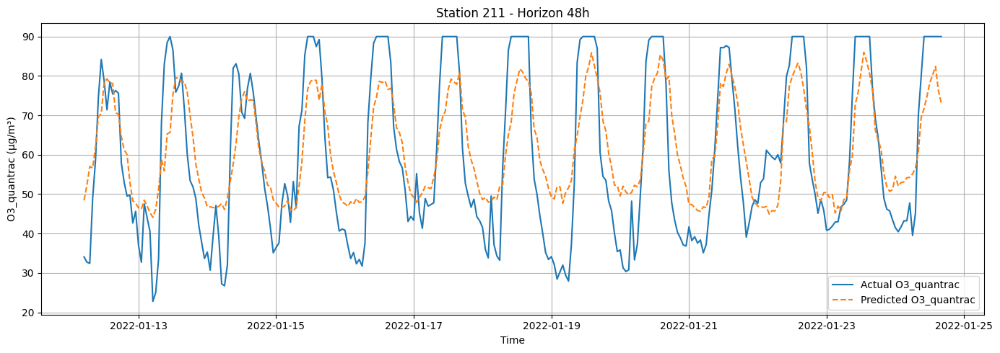

hour = 72
X_test_sid.shape: (570, 68)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


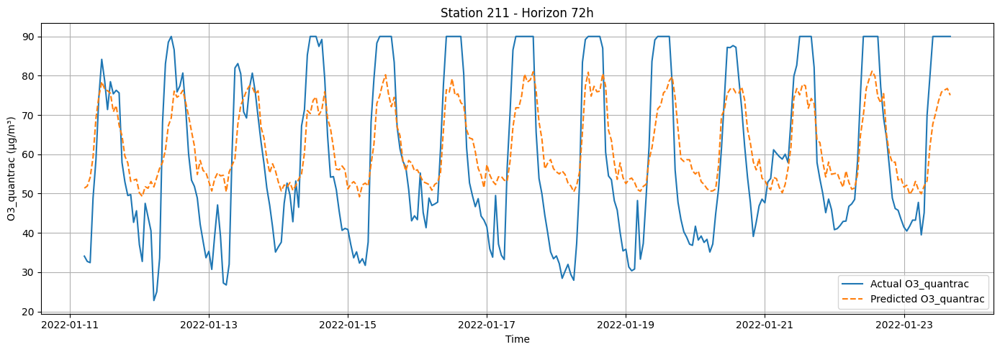

station_id = 212
hour = 1
X_test_sid.shape: (867, 68)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


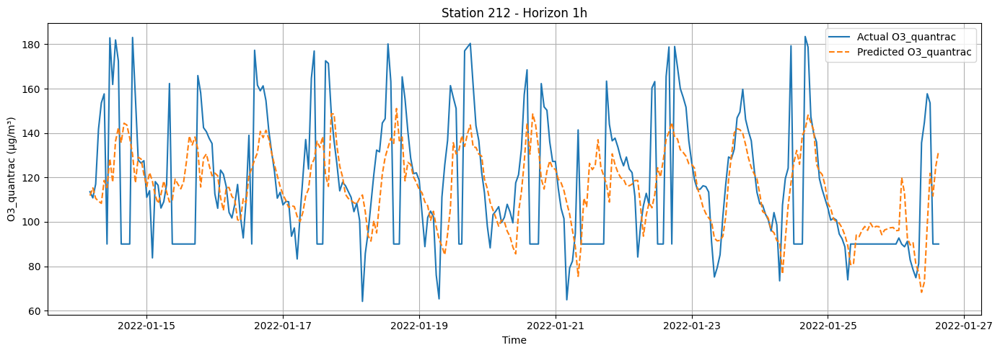

hour = 24
X_test_sid.shape: (864, 68)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


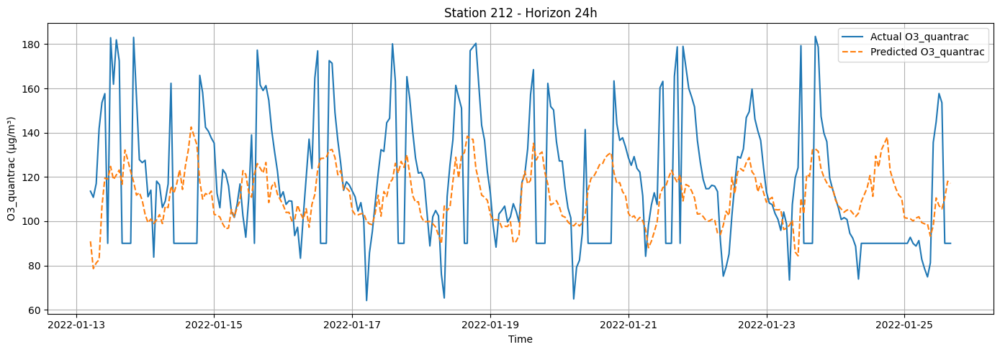

hour = 48
X_test_sid.shape: (860, 68)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


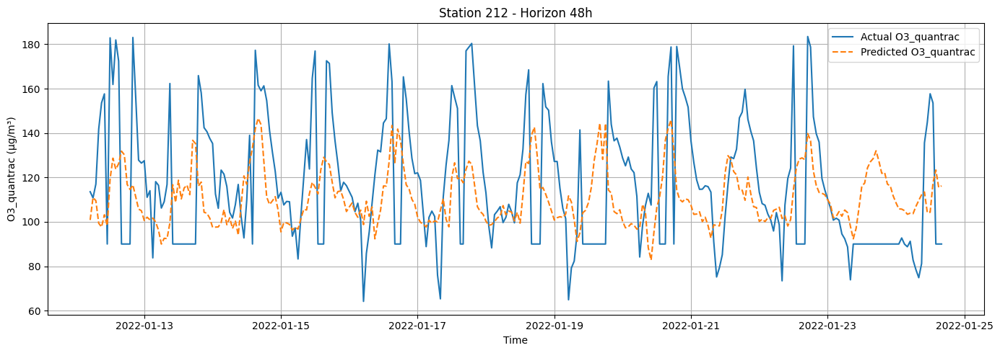

hour = 72
X_test_sid.shape: (857, 68)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


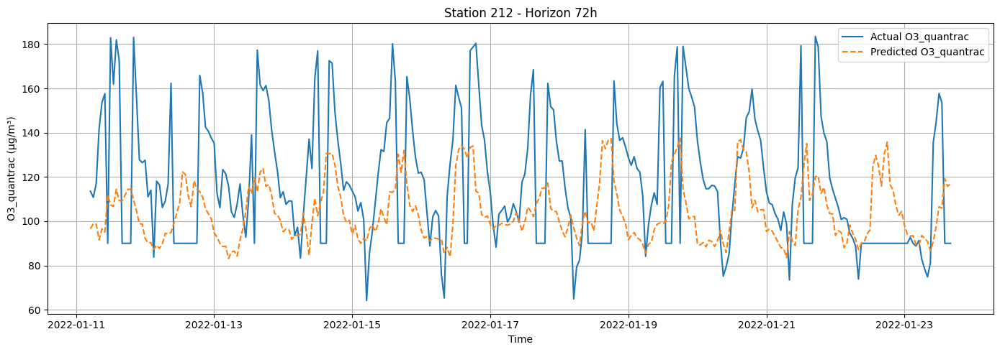

station_id = 213
hour = 1
X_test_sid.shape: (880, 68)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


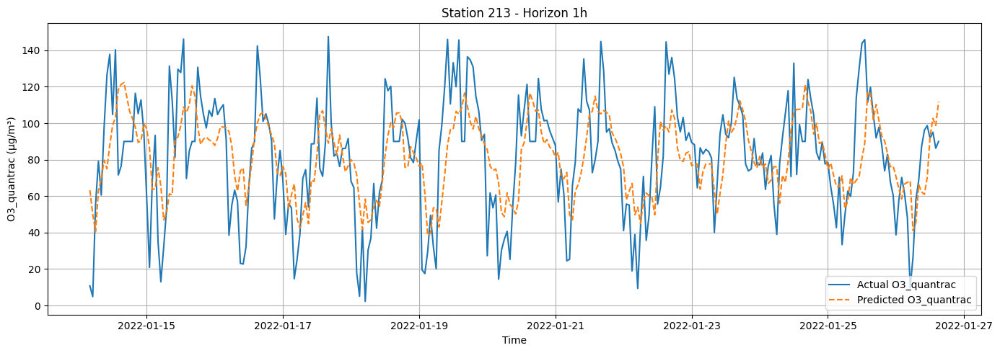

hour = 24
X_test_sid.shape: (877, 68)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


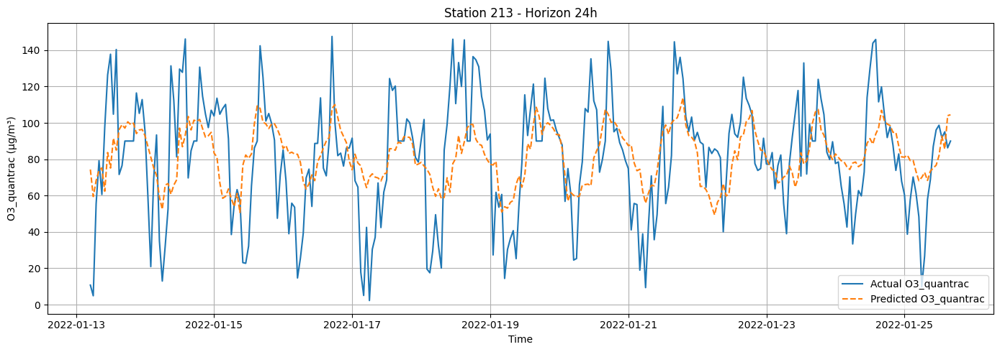

hour = 48
X_test_sid.shape: (873, 68)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


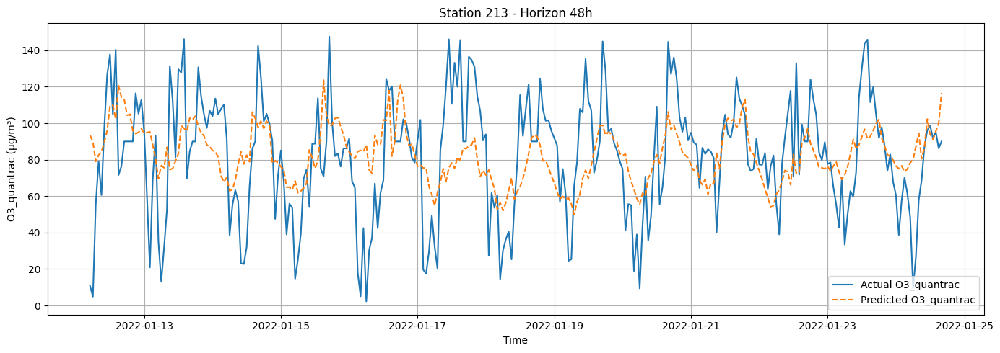

hour = 72
X_test_sid.shape: (869, 68)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


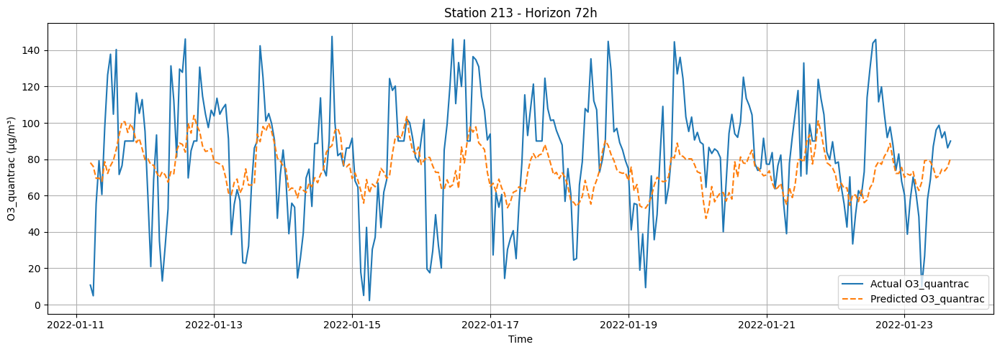

station_id = 214
hour = 1
X_test_sid.shape: (906, 68)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


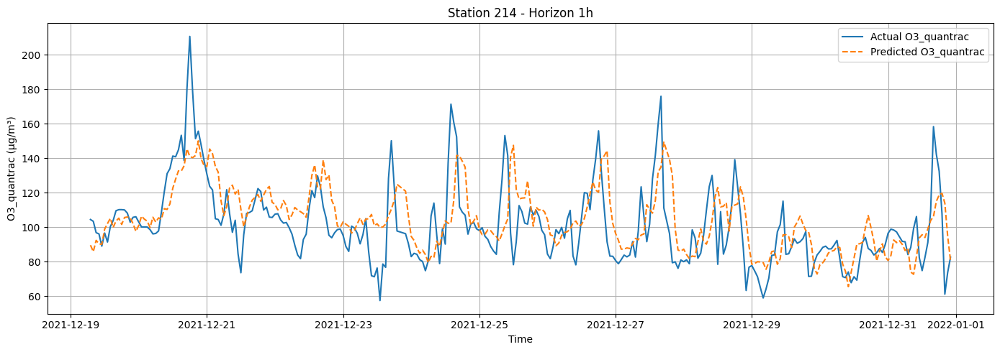

hour = 24
X_test_sid.shape: (902, 68)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


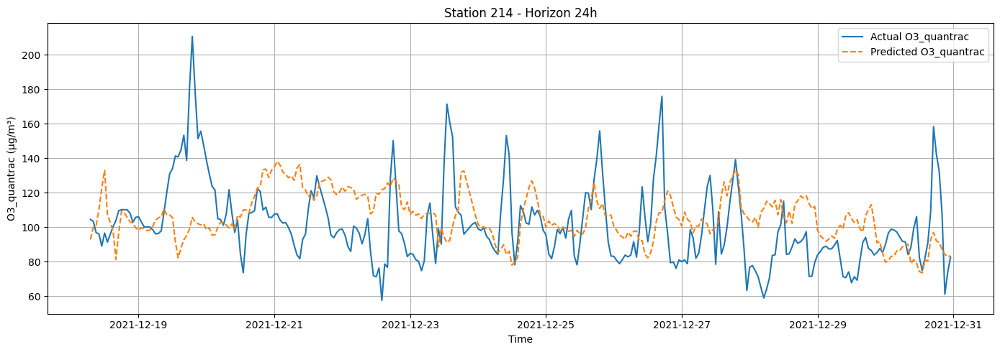

hour = 48
X_test_sid.shape: (899, 68)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


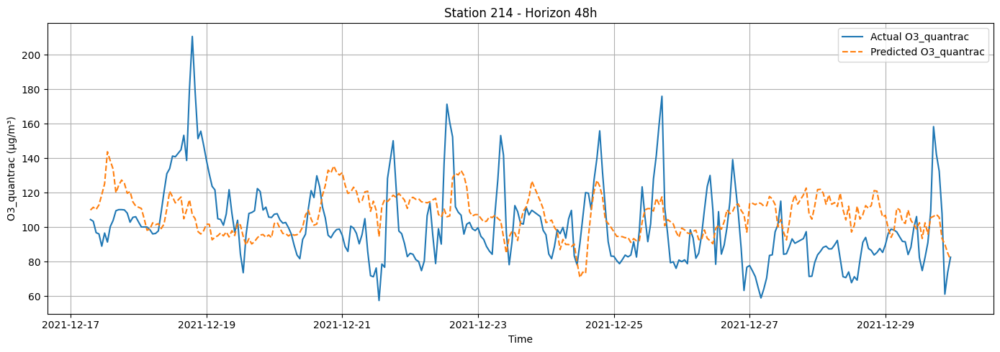

hour = 72
X_test_sid.shape: (895, 68)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


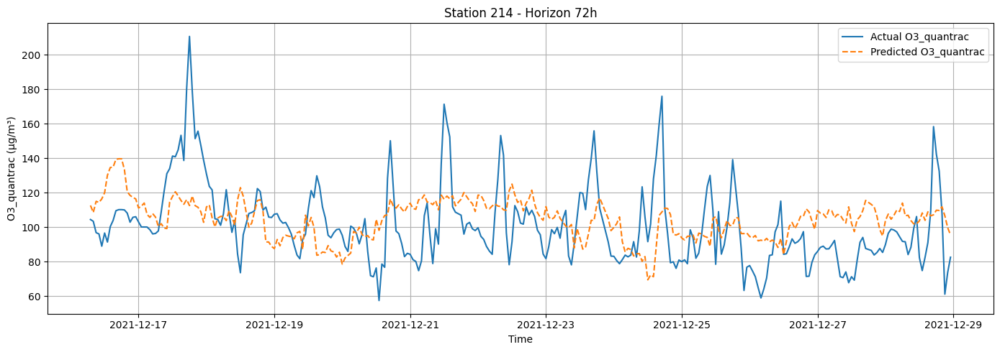

station_id = 215
hour = 1
X_test_sid.shape: (461, 68)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


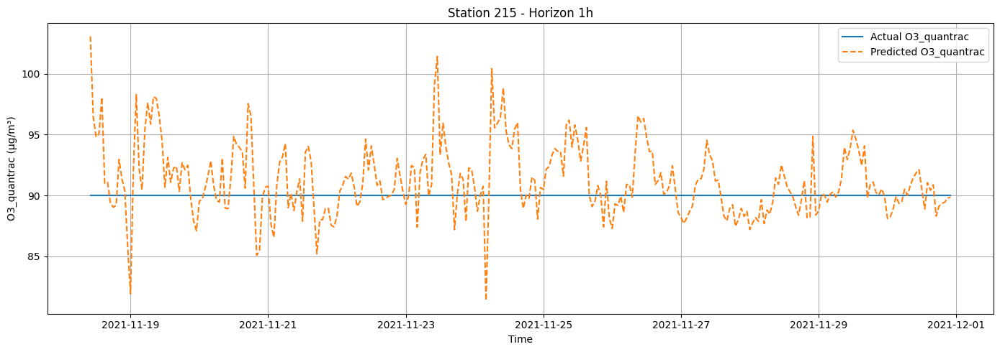

hour = 24
X_test_sid.shape: (458, 68)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


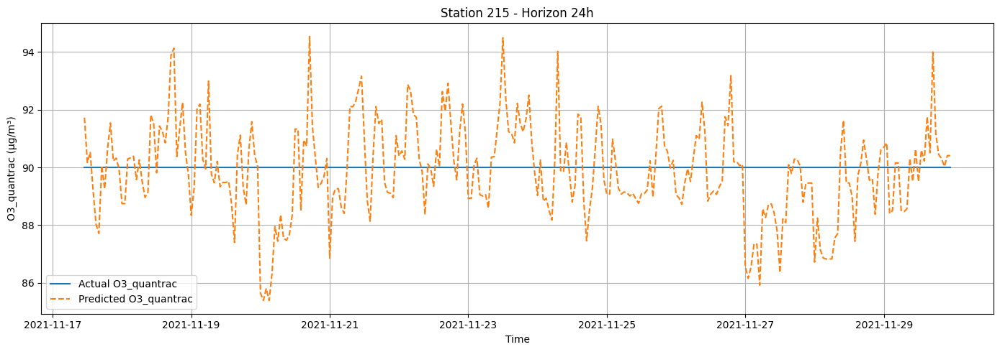

hour = 48
X_test_sid.shape: (454, 68)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


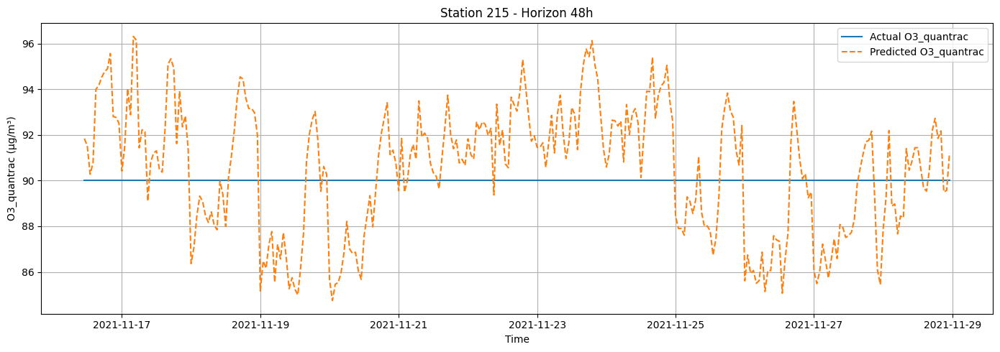

hour = 72
X_test_sid.shape: (450, 68)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


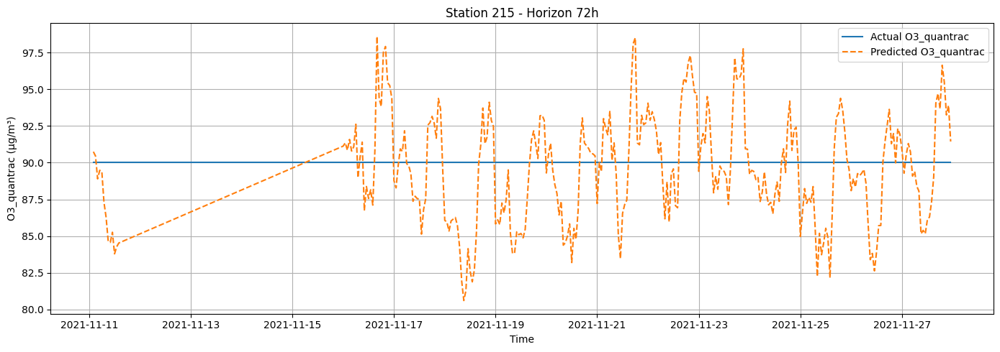

station_id = 216
hour = 1
X_test_sid.shape: (2046, 68)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


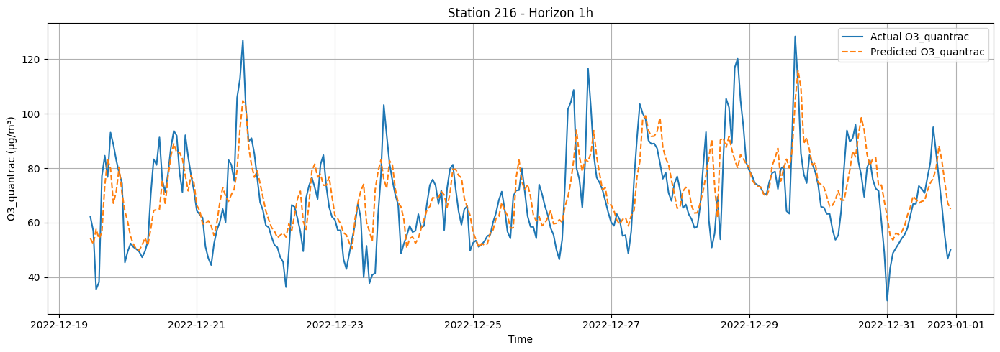

hour = 24
X_test_sid.shape: (2043, 68)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


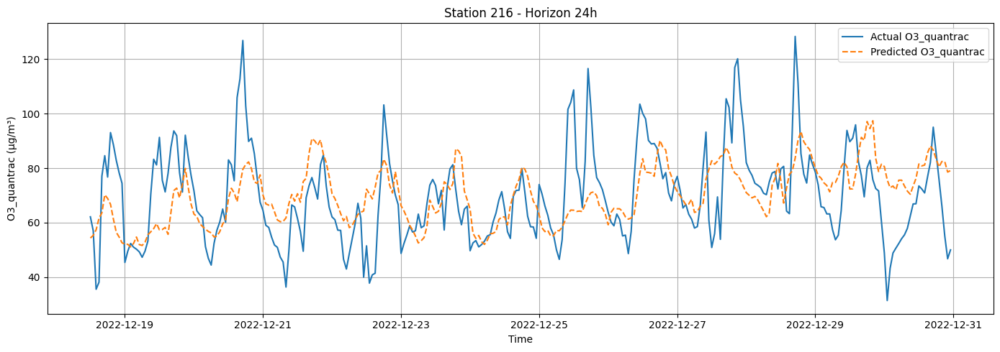

hour = 48
X_test_sid.shape: (2039, 68)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


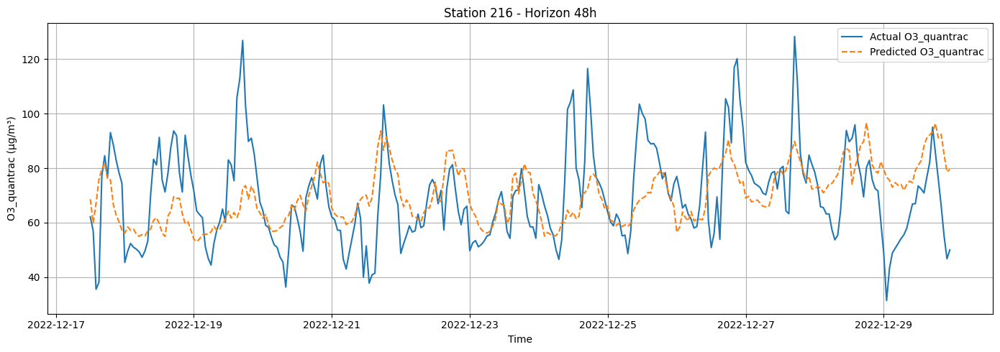

hour = 72
X_test_sid.shape: (2036, 68)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


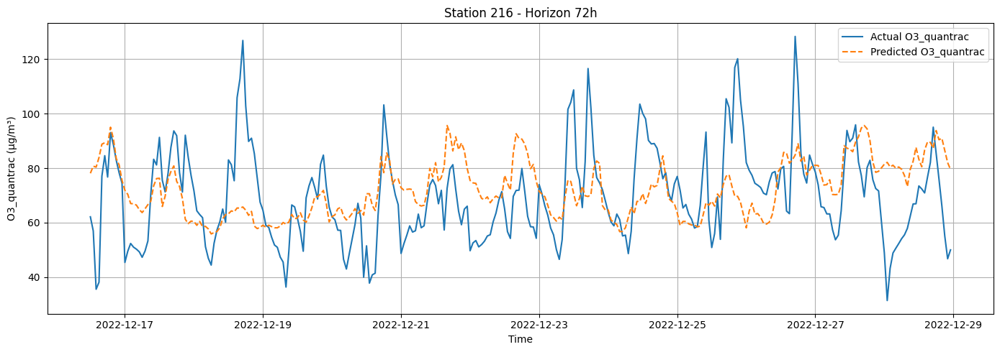

In [18]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [19]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
co_station_to_embedding, _ = learn_station_embeddings(df_co, target_col=label, station_col="station_id", embed_dim=4)
df_co, _ = attach_station_embedding(df_co, co_station_to_embedding, station_col="station_id")
print(co_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as co_emb_file:
    pickle.dump(co_station_to_embedding, co_emb_file)

# Print dataset
display(df_co)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all

[Embed] epoch 001 | train MSE=1166936.2412 | val MSE=1140335.4564
[Embed] epoch 010 | train MSE=1133271.6681 | val MSE=1102984.0626
[Embed] epoch 020 | train MSE=1012663.1579 | val MSE=979906.9911
[Embed] epoch 030 | train MSE=839978.6087 | val MSE=808127.9540
[Embed] epoch 040 | train MSE=657308.5678 | val MSE=629350.8762
[Embed] epoch 050 | train MSE=502019.6377 | val MSE=479894.8422
{211: [-9.1424675, -9.570723, -10.159096, 8.830111], 212: [-1.9979348, -4.0776124, -2.5172603, 1.1684203], 213: [-10.647095, -11.673682, -11.487389, 11.10486], 214: [-12.096144, -10.875263, -13.295887, 10.625471], 215: [-11.388142, -11.457361, -10.267969, 10.315793], 216: [-12.22883, -11.686434, -12.453338, 11.830644]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,CO_quantrac_roll24_mean,CO_quantrac_roll24_std,CO_quantrac_roll48_mean,CO_quantrac_roll48_std,CO_quantrac_roll71_mean,CO_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,90.0000000000,NaN,90.0000000000,NaN,90.0000000000,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,645.3017645000,785.3152865656,645.3017645000,785.3152865656,645.3017645000,785.3152865656,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,822.8335096667,634.7539769726,822.8335096667,634.7539769726,822.8335096667,634.7539769726,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,639.6251322500,634.7201318253,639.6251322500,634.7201318253,639.6251322500,634.7201318253,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,1472.2937525476,516.9231499153,1674.4435738753,871.0825423549,1626.5486109051,845.8444802008,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,1485.6014108809,536.8199439348,1683.6060280420,876.3799781822,1624.6157414215,843.9032032550,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,1491.7654608809,545.5955779660,1679.6041738753,873.0368958297,1628.9956559755,846.6296692707,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,1526.4720886587,599.2656943825,1683.4985155420,877.5756900124,1644.6228249896,857.4628823123,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539



===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (38260, 70)
y.shape = (38260, 3)

Number of features: 70

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag2
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag2
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag2
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag2
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag2
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag2
Humid_quantrac_l

,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,40.70,33.52,4.48,1.31,0.54,581,1.36
6,211,24,55.91,43.78,5.81,-1.10,0.10,578,-1.11
12,211,48,40.20,29.44,3.89,-0.03,0.14,574,0.03
18,211,72,57.87,42.96,5.60,4.77,-0.08,570,4.85
1,212,1,30.59,24.66,26.21,-1.04,0.34,867,-4.25
7,212,24,32.00,22.18,20.37,-19.88,0.20,864,-27.41
13,212,48,49.65,37.56,37.92,-37.91,-0.02,860,-46.76
19,212,72,107.20,81.27,86.55,-86.55,-0.01,857,-101.57
2,213,1,400.34,287.02,70.63,-47.61,0.49,880,4.22
8,213,24,457.10,332.10,70.15,-39.37,0.27,877,10.17


station_id = 211
hour = 1
X_test_sid.shape: (581, 68)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


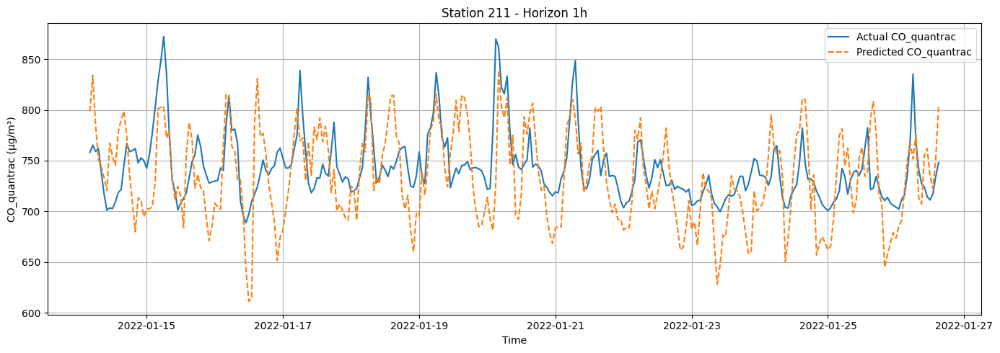

hour = 24
X_test_sid.shape: (578, 68)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


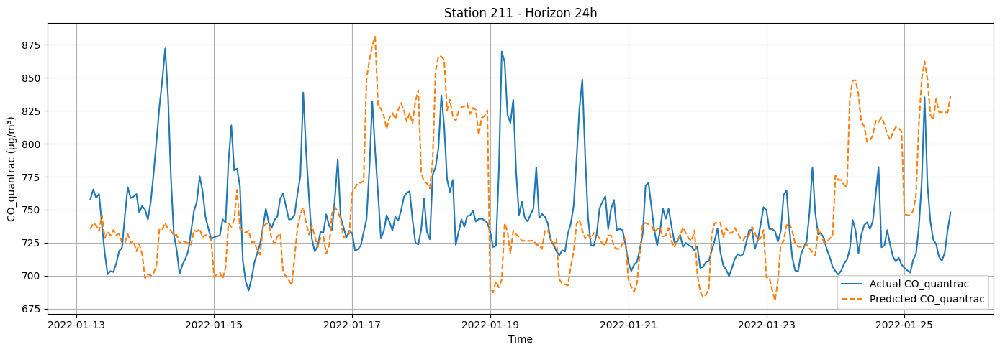

hour = 48
X_test_sid.shape: (574, 68)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


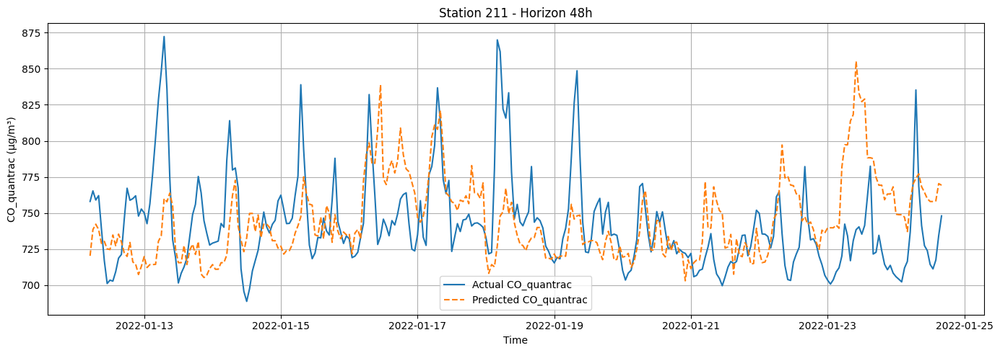

hour = 72
X_test_sid.shape: (570, 68)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


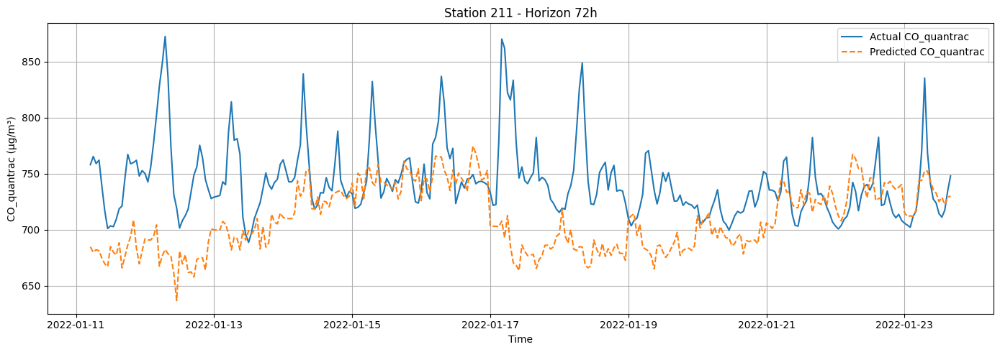

station_id = 212
hour = 1
X_test_sid.shape: (867, 68)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


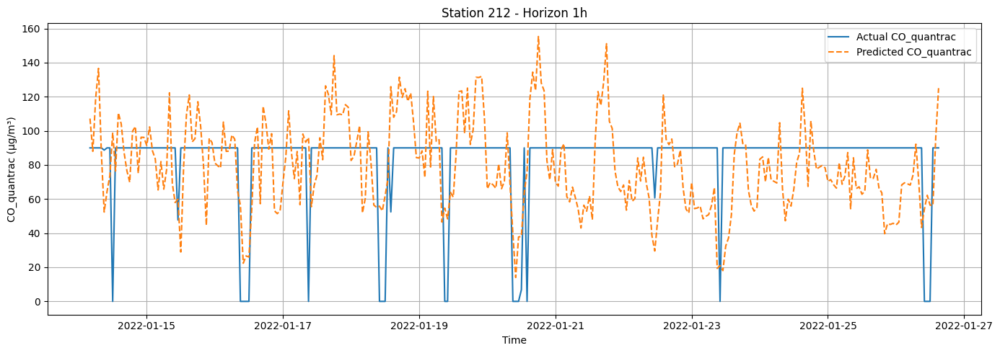

hour = 24
X_test_sid.shape: (864, 68)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


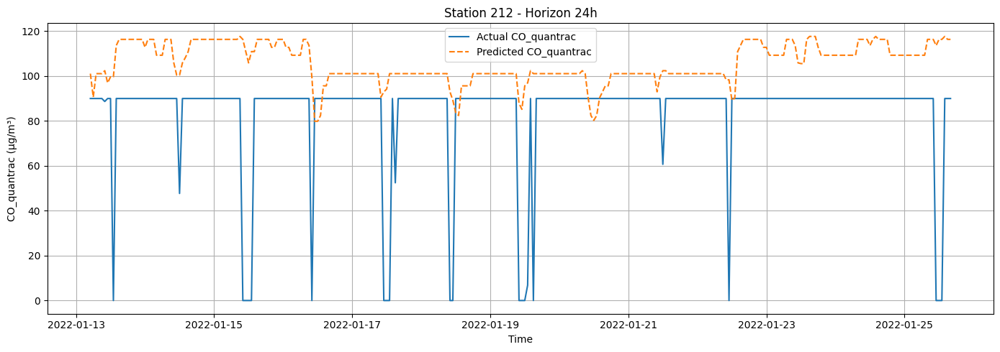

hour = 48
X_test_sid.shape: (860, 68)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


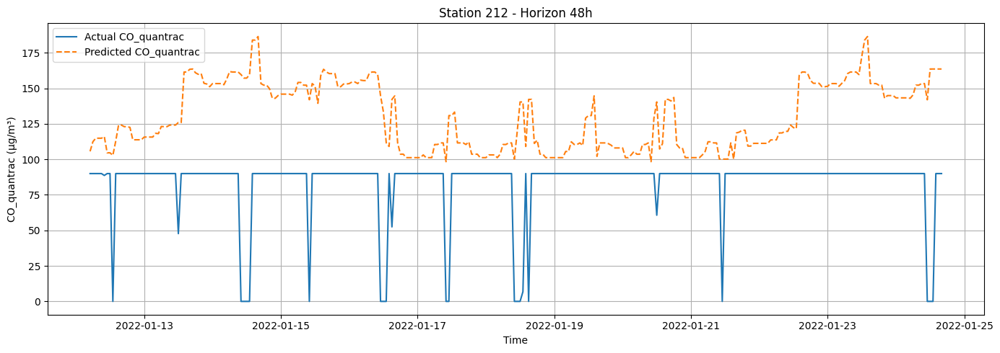

hour = 72
X_test_sid.shape: (857, 68)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


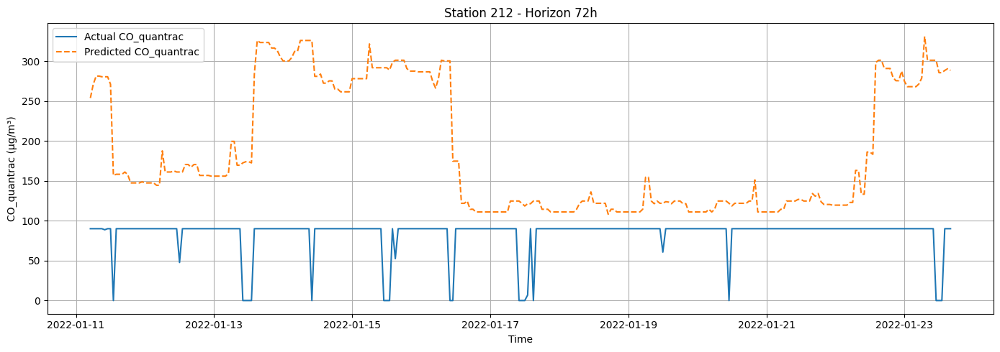

station_id = 213
hour = 1
X_test_sid.shape: (880, 68)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


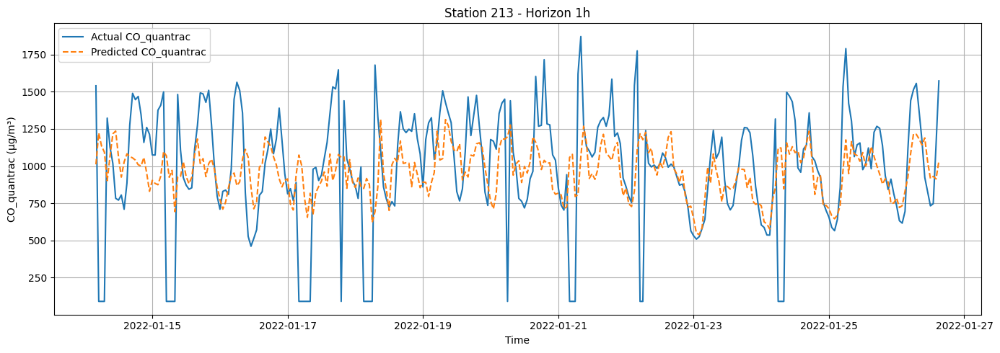

hour = 24
X_test_sid.shape: (877, 68)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


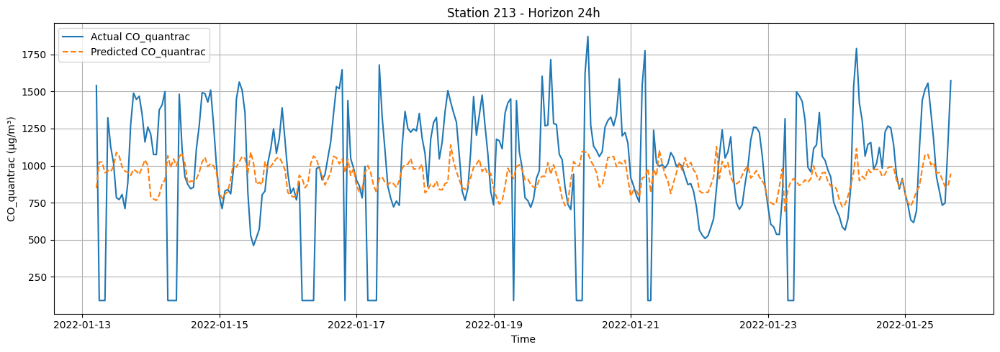

hour = 48
X_test_sid.shape: (873, 68)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


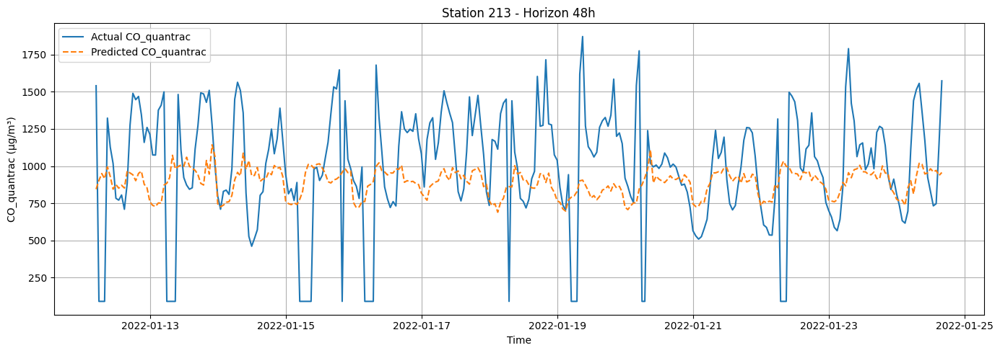

hour = 72
X_test_sid.shape: (869, 68)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


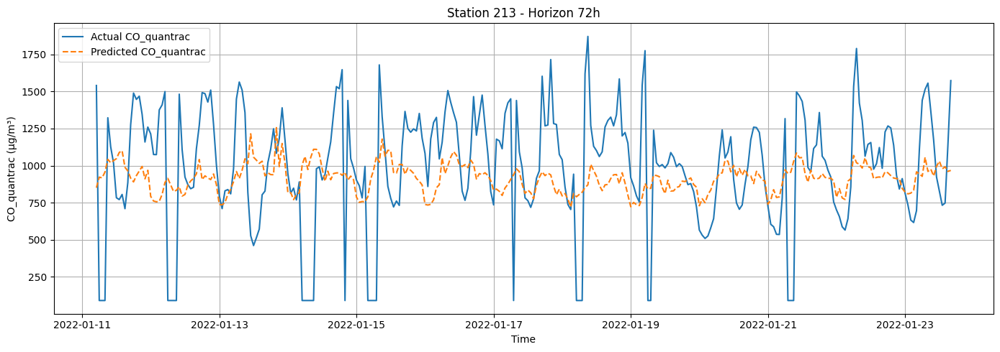

station_id = 214
hour = 1
X_test_sid.shape: (906, 68)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


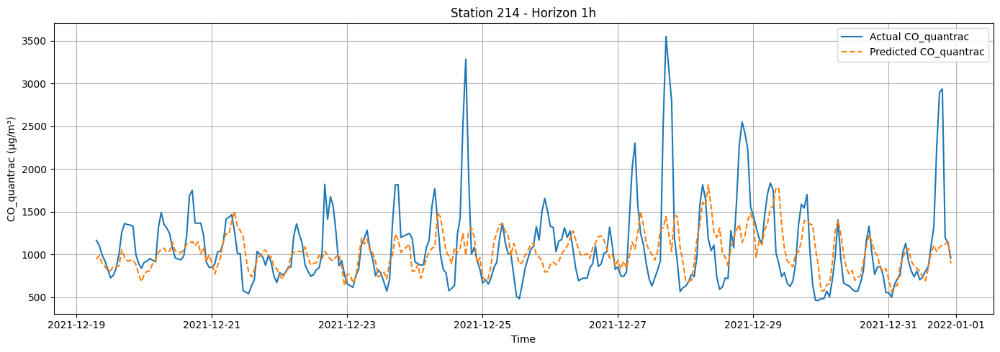

hour = 24
X_test_sid.shape: (902, 68)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


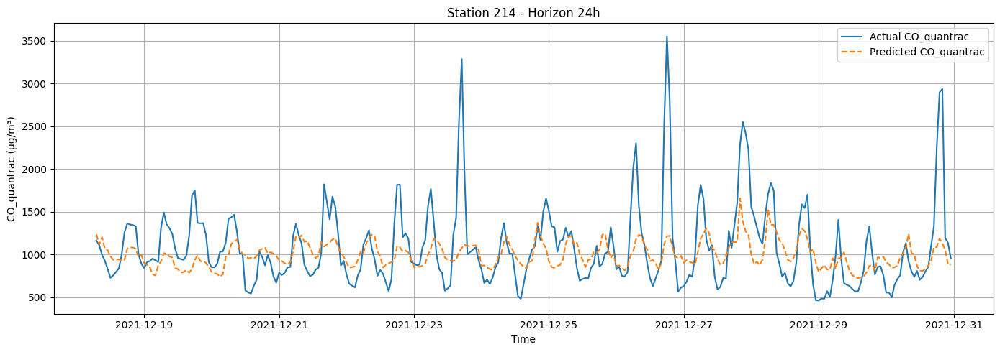

hour = 48
X_test_sid.shape: (899, 68)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


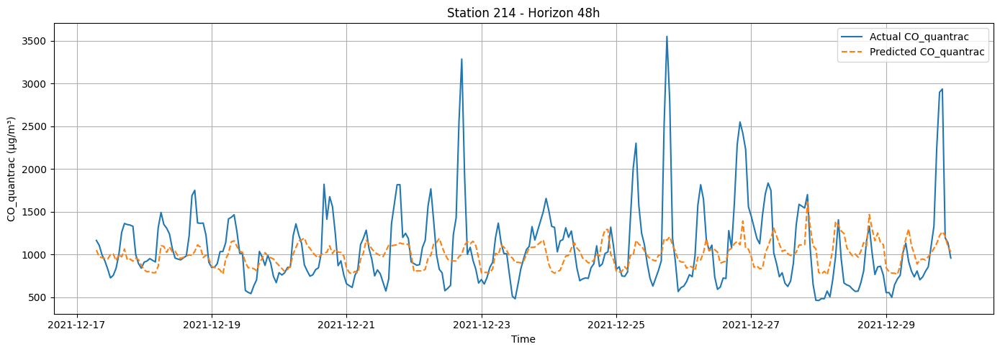

hour = 72
X_test_sid.shape: (895, 68)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


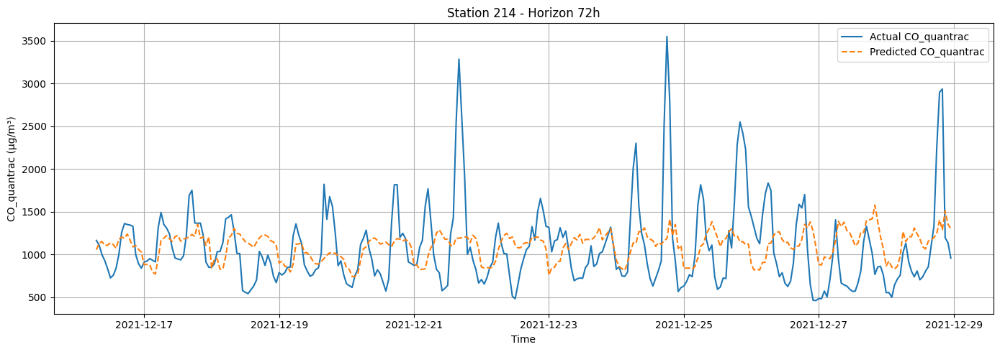

station_id = 215
hour = 1
X_test_sid.shape: (461, 68)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


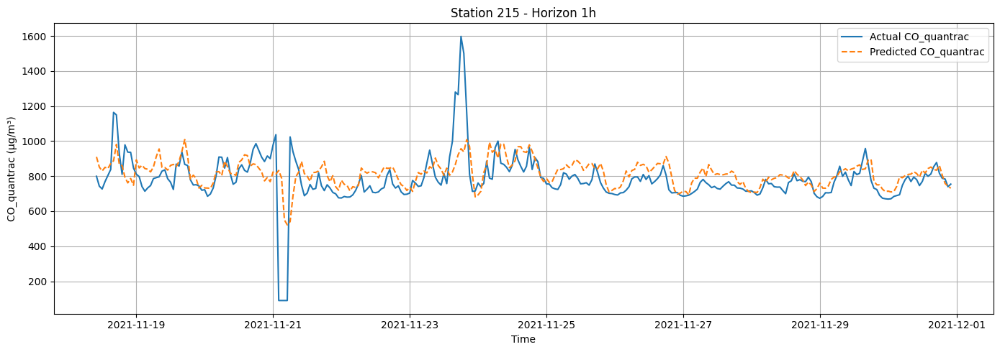

hour = 24
X_test_sid.shape: (458, 68)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


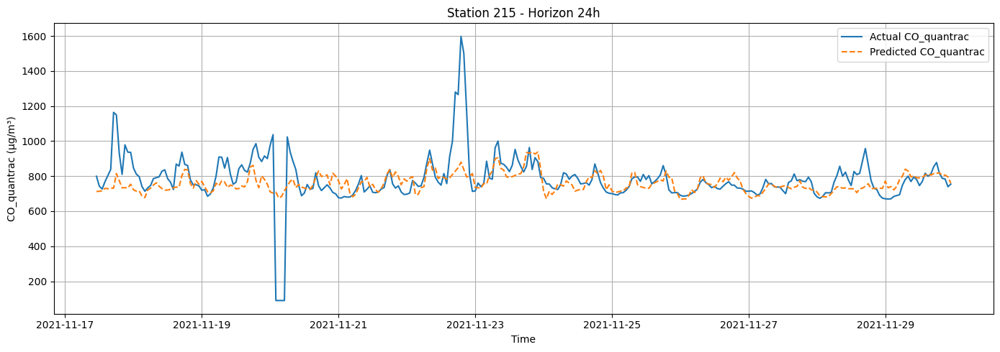

hour = 48
X_test_sid.shape: (454, 68)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


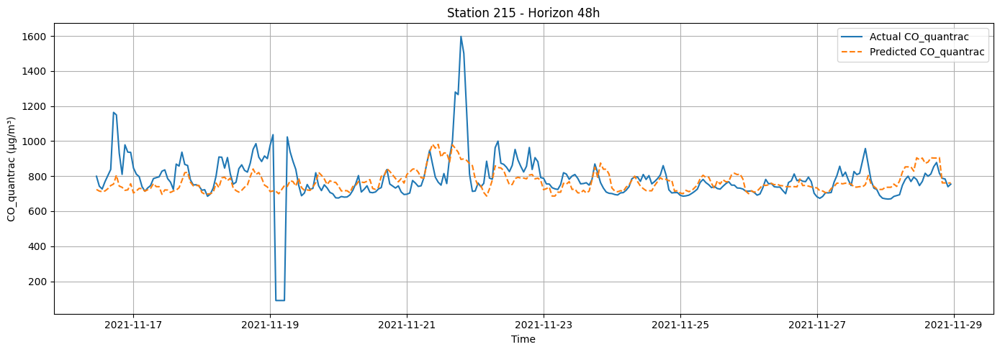

hour = 72
X_test_sid.shape: (450, 68)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


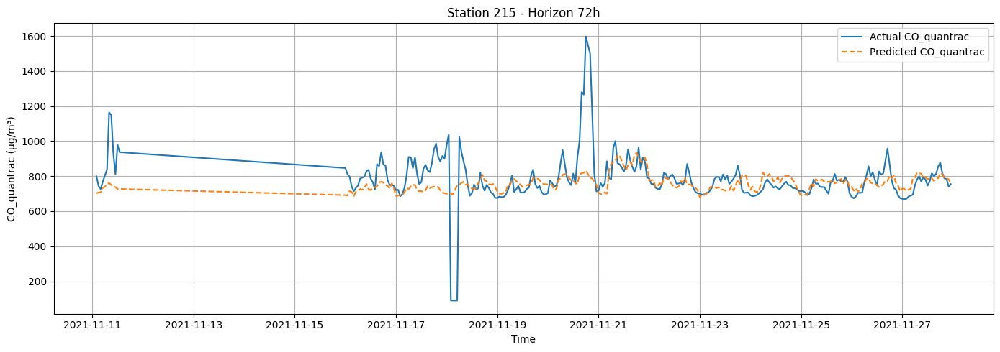

station_id = 216
hour = 1
X_test_sid.shape: (2046, 68)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


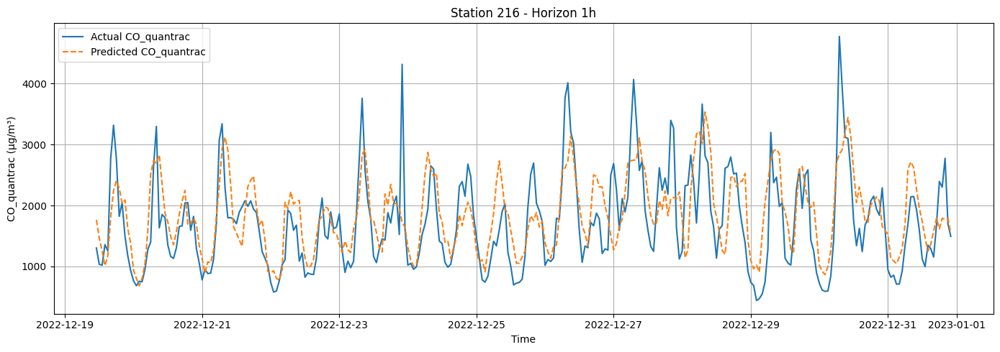

hour = 24
X_test_sid.shape: (2043, 68)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


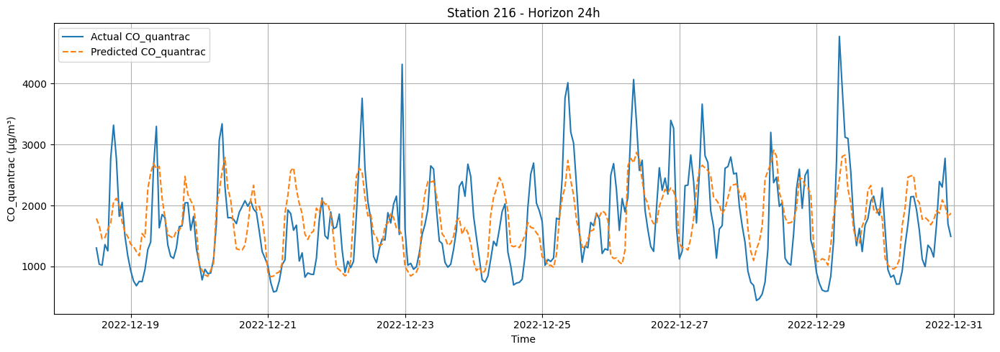

hour = 48
X_test_sid.shape: (2039, 68)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


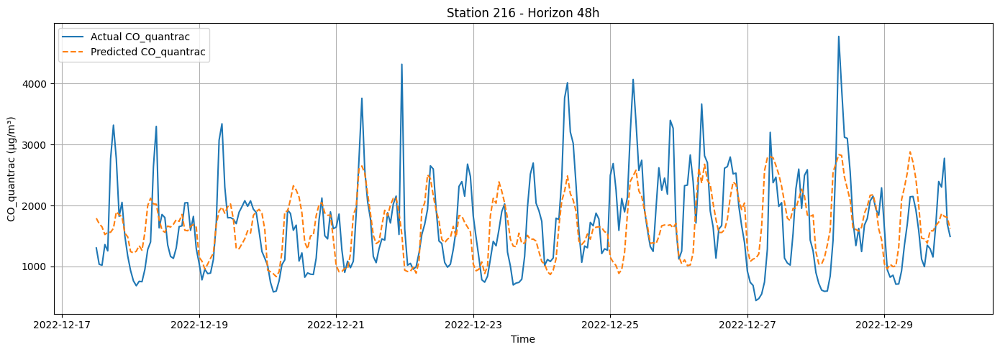

hour = 72
X_test_sid.shape: (2036, 68)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


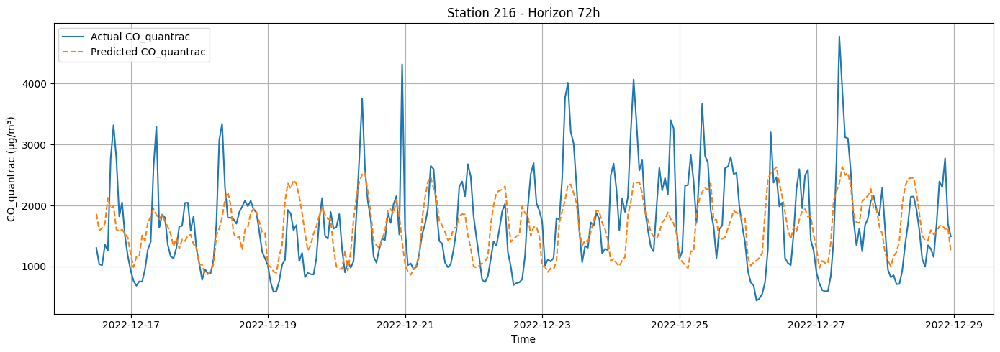

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)